# Features description


Our Data contains 6 features:

Date: Indicates the specific calendar day of each data point, providing a temporal reference for analysis.

High: Represents the peak price reached during the trading day, reflecting maximum market activity.

Close: Signifies the final price of the trading day, offering insight into investor sentiment at market close.

Low: Denotes the minimum price observed during the trading day, highlighting intraday price fluctuations.

Open: Reveals the initial price at market opening, providing context for early market sentiment.

Ind_Name: Identifies the associated index .




# **Libraries** **Importation**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import random
import sklearn
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.feature_selection import f_classif
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
import plotly.graph_objects as go
import plotly.express as px
sns.set_style('whitegrid')
plt.style.use("fivethirtyeight")
%matplotlib inline
from pandas_datareader.data import DataReader
from pandas_datareader import data as pdr
from statsmodels.tsa.seasonal import seasonal_decompose
from plotly.subplots import make_subplots
from scipy.signal import find_peaks
import scipy.stats as stats
import statsmodels.api as sm
from datetime import datetime
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import os
import warnings
warnings.filterwarnings('ignore')
plt.style.use('fivethirtyeight')
from pylab import rcParams
rcParams['figure.figsize'] = 10, 6
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima_model import ARIMA

from sklearn.metrics import mean_squared_error, mean_absolute_error
import math

# **Reading and Understanding the Data**

In [ ]:
combined_indexes = pd.read_csv("Combined_Indexes_1.csv", sep=';')

In [ ]:
 combined_indexes.head()

,Date,High,Close,Low,Open,Ind_Name,std_close,ROI,7_Days_Average_ROI,ROI_Monthly_Avg,Kurtosis,Skewness,yearly_std
0,02/01/2020,9385.891,9258.853,9220.350,9374.647,TUNALIM,1136.849769,-1.235183,-0.236159,-0.115782,2.737252,-0.183288,830.67866
1,03/01/2020,9400.689,9355.501,9245.532,9257.826,TUNALIM,1136.849769,1.055053,-0.236159,-0.115782,2.737252,-0.183288,830.67866
2,06/01/2020,9410.592,9270.607,9264.979,9264.340,TUNALIM,1136.849769,0.067646,-0.236159,-0.115782,2.737252,-0.183288,830.67866
3,07/01/2020,9306.529,9234.977,9210.644,9267.688,TUNALIM,1136.849769,-0.352958,-0.236159,-0.115782,2.737252,-0.183288,830.67866
4,08/01/2020,9235.565,9158.477,9162.298,9234.124,TUNALIM,1136.849769,-0.819211,-0.236159,-0.115782,2.737252,-0.183288,830.67866


In [ ]:
combined_indexes.tail()

,Date,High,Close,Low,Open,Ind_Name,std_close,ROI,7_Days_Average_ROI,ROI_Monthly_Avg,Kurtosis,Skewness,yearly_std
13423,01/02/2024,6405.802,6379.789,6358.646,6382.012,TUNFIN,873.754608,-0.034832,0.002393,-0.054868,0.17438,-1.007301,31.411209
13424,02/02/2024,6382.145,6371.864,6351.213,6383.654,TUNFIN,873.754608,-0.184690,-0.074825,-0.054868,0.17438,-1.007301,31.411209
13425,05/02/2024,6375.804,6363.838,6347.672,6370.520,TUNFIN,873.754608,-0.104889,-0.074825,-0.054868,0.17438,-1.007301,31.411209
13426,06/02/2024,6370.620,6354.666,6330.714,6368.473,TUNFIN,873.754608,-0.216802,-0.074825,-0.054868,0.17438,-1.007301,31.411209
13427,07/02/2024,6367.051,6362.852,6323.823,6349.703,TUNFIN,873.754608,0.207081,-0.074825,-0.054868,0.17438,-1.007301,31.411209


In [ ]:
combined_indexes.shape

(13428, 13)

In [ ]:
combined_indexes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13428 entries, 0 to 13427
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Date                13428 non-null  object 
 1   High                13428 non-null  float64
 2   Close               13428 non-null  float64
 3   Low                 13428 non-null  float64
 4   Open                13428 non-null  float64
 5   Ind_Name            13428 non-null  object 
 6   std_close           13428 non-null  float64
 7   ROI                 13428 non-null  float64
 8   7_Days_Average_ROI  13428 non-null  float64
 9   ROI_Monthly_Avg     13428 non-null  float64
 10  Kurtosis            13428 non-null  float64
 11  Skewness            13428 non-null  float64
 12  yearly_std          13428 non-null  float64
dtypes: float64(11), object(2)
memory usage: 1.3+ MB


In [ ]:
combined_indexes['Date'] = pd.to_datetime(combined_indexes['Date'], errors='coerce', dayfirst=True)  # Adjust based on your date format

In [ ]:
combined_indexes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13428 entries, 0 to 13427
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date                13428 non-null  datetime64[ns]
 1   High                13428 non-null  float64       
 2   Close               13428 non-null  float64       
 3   Low                 13428 non-null  float64       
 4   Open                13428 non-null  float64       
 5   Ind_Name            13428 non-null  object        
 6   std_close           13428 non-null  float64       
 7   ROI                 13428 non-null  float64       
 8   7_Days_Average_ROI  13428 non-null  float64       
 9   ROI_Monthly_Avg     13428 non-null  float64       
 10  Kurtosis            13428 non-null  float64       
 11  Skewness            13428 non-null  float64       
 12  yearly_std          13428 non-null  float64       
dtypes: datetime64[ns](1), float64(11), object(1)
m

In [ ]:
combined_indexes.describe()

,Date,High,Close,Low,Open,std_close,ROI,7_Days_Average_ROI,ROI_Monthly_Avg,Kurtosis,Skewness,yearly_std
count,13428,13428.000000,13428.000000,13428.000000,13428.000000,13428.000000,13428.000000,13428.000000,13428.000000,13428.000000,13428.000000,13428.000000
mean,2022-01-22 22:43:25.898123008,5501.544526,5479.582096,5452.183167,5480.721896,647.074777,-0.030613,-0.030613,-0.030613,1.180505,0.078834,277.099286
min,2020-01-02 00:00:00,435.010000,432.010000,425.308000,432.096000,85.208728,-5.192603,-1.938242,-0.330524,0.133982,-1.873376,18.891198
25%,2021-01-15 00:00:00,2946.877250,2934.902250,2916.697000,2936.418250,324.353287,-0.365980,-0.180783,-0.088968,0.604026,-0.174081,126.614729
50%,2022-01-27 00:00:00,4490.994000,4470.771500,4448.677500,4472.722500,758.379164,-0.020536,-0.014885,-0.018834,0.935366,0.173647,240.291268
75%,2023-01-27 00:00:00,7719.395750,7685.786000,7625.253750,7683.275250,873.754608,0.297920,0.142065,0.046600,1.409457,0.465311,349.840008
max,2024-02-07 00:00:00,14503.087000,14436.682000,14302.238000,14465.707000,1392.238639,4.410611,2.085494,0.189979,4.698604,1.131854,830.678660
std,NaN,3317.835026,3308.361166,3295.995483,3308.082858,380.509627,0.727488,0.314509,0.101235,0.859859,0.611117,192.868246


In [ ]:
combined_indexes.describe(include='object')

,Ind_Name
count,13428
unique,13
top,TUNALIM
freq,1033


Checking Missing Values

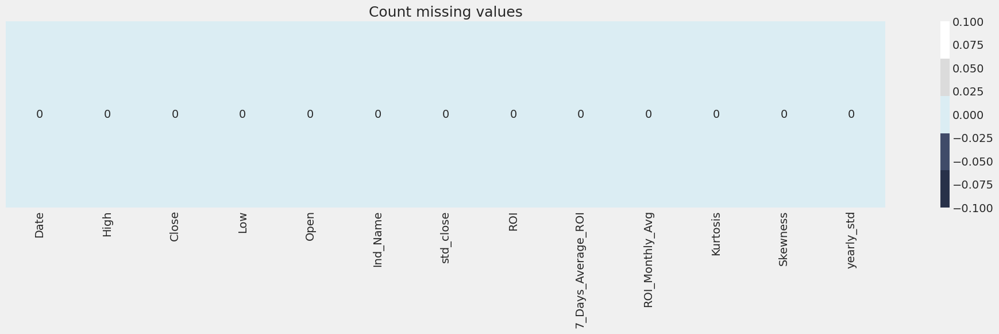

In [ ]:
# Missing values
plt.figure(figsize=(22,4))
sns.heatmap((combined_indexes.isna().sum()).to_frame(name='').T,cmap=sns.color_palette(["#283149", "#404B69", "#DBEDF3", "#DBDBDB", "#FFFFFF"]), annot=True,
             fmt='0.0f').set_title('Count missing values', fontsize=18)
plt.show()

In [ ]:
combined_indexes.isnull().sum()

Date                  0
High                  0
Close                 0
Low                   0
Open                  0
Ind_Name              0
std_close             0
ROI                   0
7_Days_Average_ROI    0
ROI_Monthly_Avg       0
Kurtosis              0
Skewness              0
yearly_std            0
dtype: int64

Checking Duplicated Values

In [ ]:
total = combined_indexes.shape[0]
missing_columns = [col for col in combined_indexes.columns if combined_indexes[col].isnull().sum() > 0]
for col in missing_columns:
    null_count = combined_indexes[col].isnull().sum()
    per = (null_count/total) * 100
    print(f"{col}: {null_count} ({round(per, 3)}%)")
print(f"Number of duplicate rows: {combined_indexes.duplicated().sum()}")

Number of duplicate rows: 0


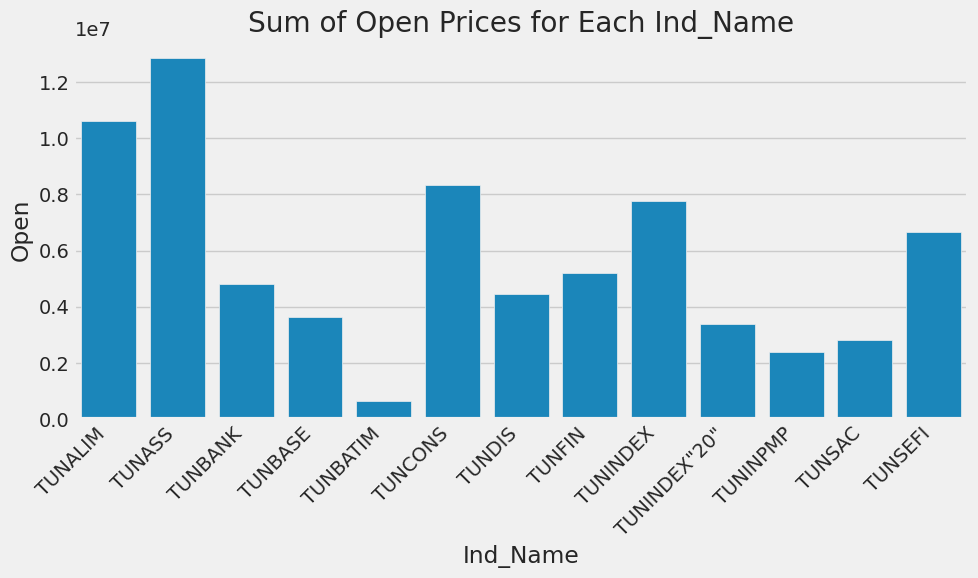

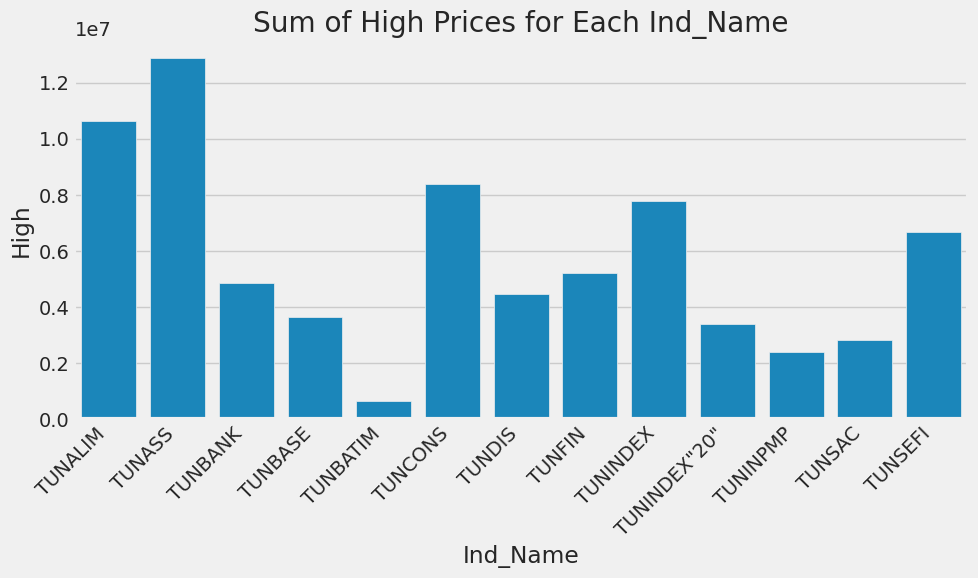

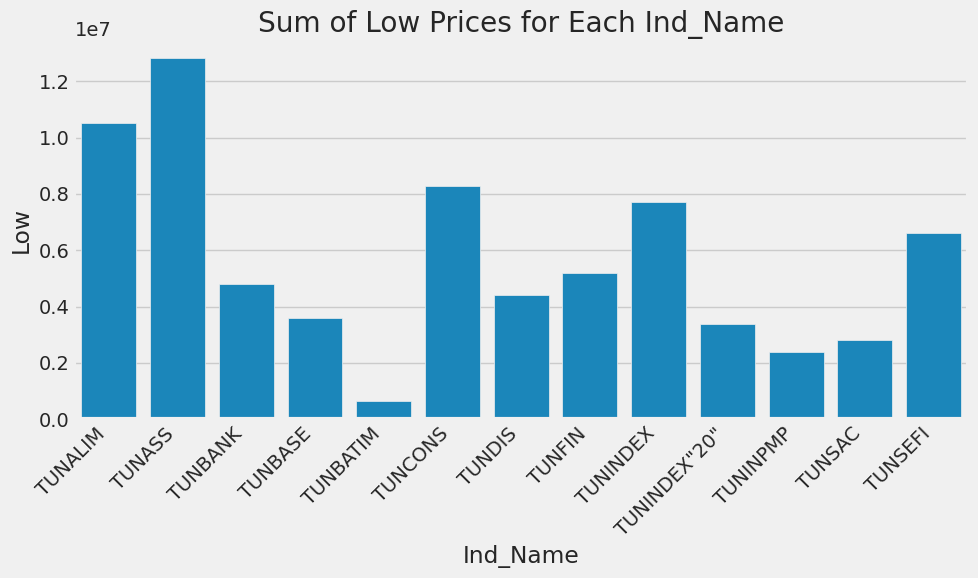

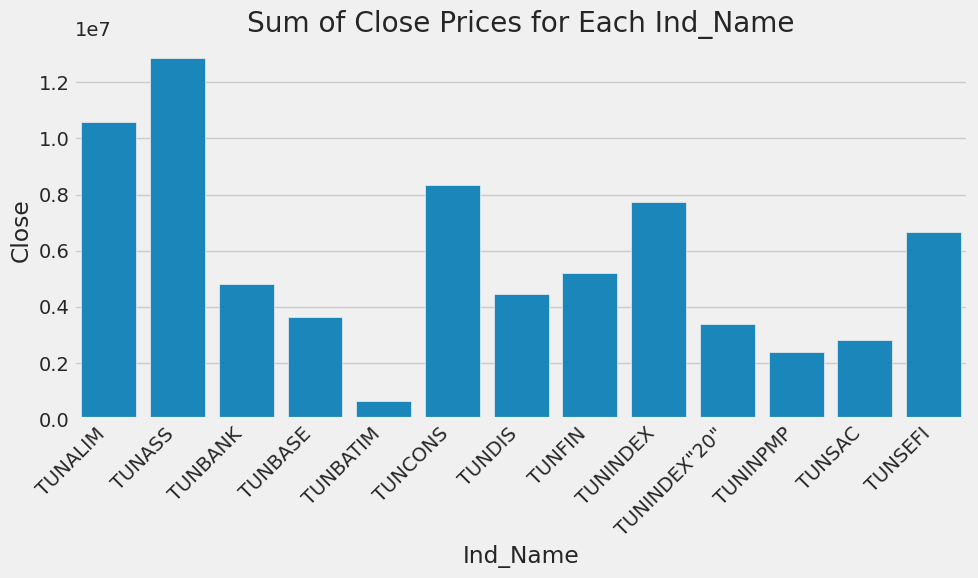

In [ ]:
aggregated_data = combined_indexes.groupby('Ind_Name').agg({
    'Open': 'sum',
    'Low': 'sum',
    'High': 'sum',
    'Close': 'sum'
}).reset_index()

# Now, you can plot these aggregated sums. Here's how to plot for 'Open':
sns.barplot(x='Ind_Name', y='Open', data=aggregated_data)
plt.xticks(rotation=45, ha='right')
plt.title('Sum of Open Prices for Each Ind_Name')
plt.tight_layout()
plt.show()

# Repeat the plotting for 'Low', 'High', and 'Close' by changing the y parameter in sns.barplot()

sns.barplot(x='Ind_Name', y='High', data=aggregated_data)
plt.xticks(rotation=45, ha='right')
plt.title('Sum of High Prices for Each Ind_Name')
plt.tight_layout()
plt.show()

sns.barplot(x='Ind_Name', y='Low', data=aggregated_data)
plt.xticks(rotation=45, ha='right')
plt.title('Sum of Low Prices for Each Ind_Name')
plt.tight_layout()
plt.show()

sns.barplot(x='Ind_Name', y='Close', data=aggregated_data)
plt.xticks(rotation=45, ha='right')
plt.title('Sum of Close Prices for Each Ind_Name')
plt.tight_layout()
plt.show()



# Data Understanding for Time Series

In [ ]:


# Chargez vos données de série temporelle dans le DataFrame combined_indexes
# Assurez-vous que vos données ont une colonne 'Date' et des colonnes pour les prix (High, Low, Close, Open)
# combined_indexes = pd.read_csv('votre_fichier.csv')

# Etape 1: Exploration des données (EDA)
# Visualiser les tendances des prix (High, Low, Close, Open) pour chaque valeur unique de 'Ind_Name'
for index_name in combined_indexes['Ind_Name'].unique():
    # Filtrer les données pour le 'Ind_Name' actuel
    data_subset = combined_indexes[combined_indexes['Ind_Name'] == index_name]

    # Créer une figure pour chaque 'Ind_Name'
    fig = go.Figure()

    # Ajouter des traces pour les prix High, Low, Close et Open
    fig.add_trace(go.Scatter(x=data_subset['Date'], y=data_subset['High'], mode='lines', name='High'))
    fig.add_trace(go.Scatter(x=data_subset['Date'], y=data_subset['Low'], mode='lines', name='Low'))
    fig.add_trace(go.Scatter(x=data_subset['Date'], y=data_subset['Close'], mode='lines', name='Close'))
    fig.add_trace(go.Scatter(x=data_subset['Date'], y=data_subset['Open'], mode='lines', name='Open'))

    # Mettre à jour la disposition de la figure
    fig.update_layout(title=f"Price Trends for {index_name}",
                      xaxis_title='Date',
                      yaxis_title='Price')

    # Afficher le graphique
    fig.show()



# Nouvelle section

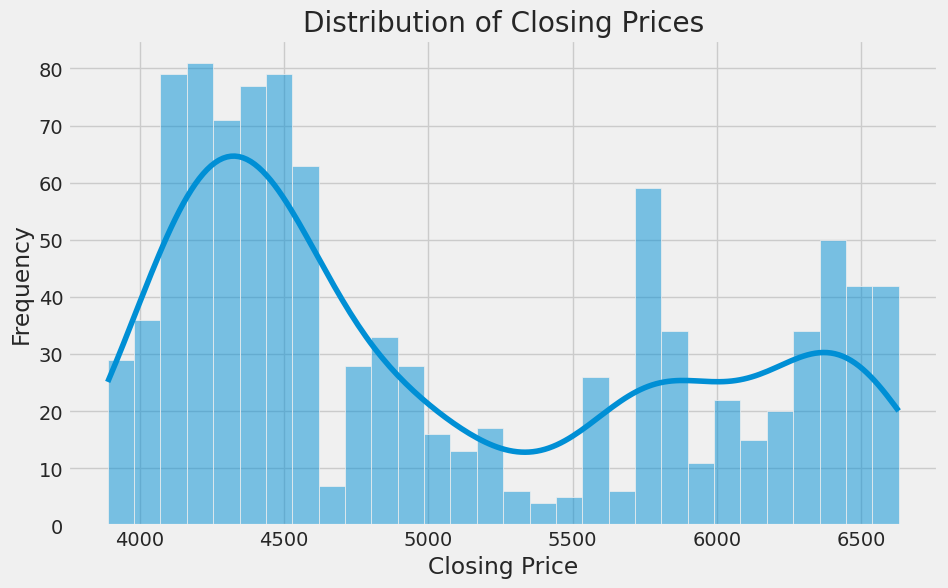

In [ ]:


# Histogramme des prix de clôture
sns.histplot(data_subset['Close'], bins=30, kde=True)
plt.title('Distribution of Closing Prices')
plt.xlabel('Closing Price')
plt.ylabel('Frequency')
plt.show()


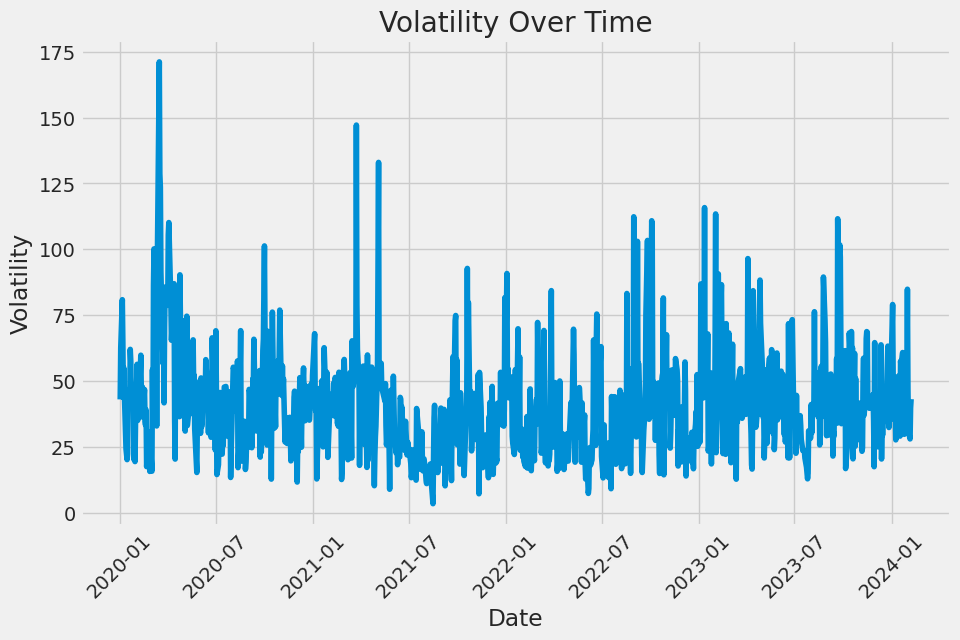

In [ ]:


# Supposons que vous avez déjà chargé vos données dans le DataFrame data_subset

# Création d'une copie explicite du DataFrame pour éviter les avertissements "SettingWithCopyWarning"
data_subset = data_subset.copy()

# Calcul de la volatilité (écart entre les prix High et Low)
data_subset['Volatility'] = data_subset['High'] - data_subset['Low']

# Tracé de la volatilité au fil du temps
plt.plot(data_subset['Date'], data_subset['Volatility'])
plt.title('Volatility Over Time')
plt.xlabel('Date')
plt.xticks(rotation=45)
plt.ylabel('Volatility')
plt.show()

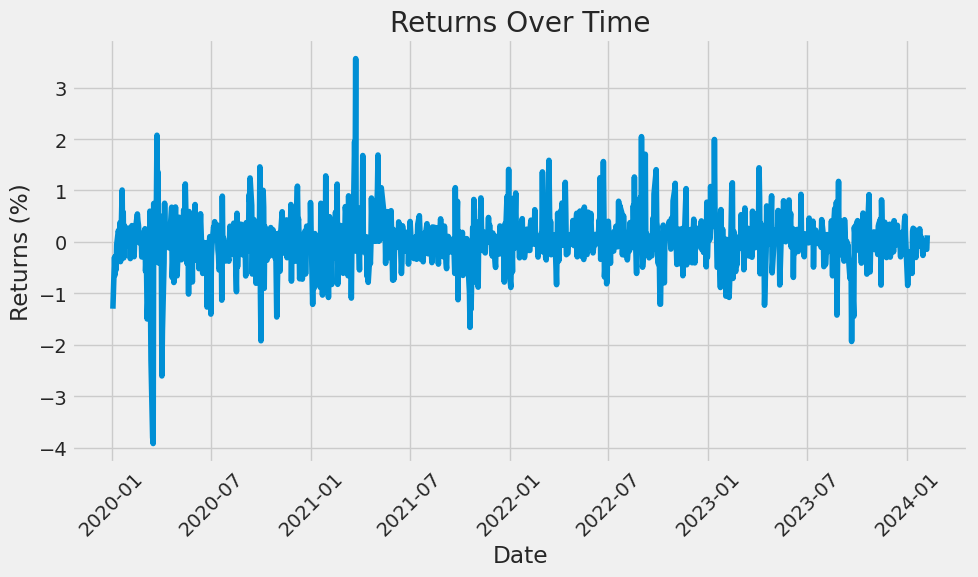

In [ ]:

# Calcul des rendements en pourcentage
data_subset['Returns'] = np.log(data_subset['Close'] / data_subset['Close'].shift(1)) * 100

# Tracé des rendements au fil du temps
plt.plot(data_subset['Date'], data_subset['Returns'])
plt.title('Returns Over Time')
plt.xlabel('Date')
plt.ylabel('Returns (%)')

# Espacement des étiquettes de l'axe des abscisses
plt.xticks(rotation=45)  # Rotation de 45 degrés pour les étiquettes
plt.tight_layout()  # Ajustement automatique de la disposition pour éviter le chevauchement
plt.show()


In [ ]:


data_subset.sort_values('Date', inplace=True)

# Grouper les données par 'Ind_Name'
grouped = data_subset.groupby('Ind_Name')

for name, group in grouped:
    # Trouver les pics et les creux
    peaks, _ = find_peaks(group['Close'], prominence=0.1)
    valleys, _ = find_peaks(-group['Close'], prominence=0.1)

    # Créer une figure Plotly
    fig = go.Figure()

    # Tracé des prix de clôture
    fig.add_trace(go.Scatter(x=group['Date'], y=group['Close'], mode='lines', name='Prix de Clôture'))

    # Marquer les pics
    fig.add_trace(go.Scatter(x=group.iloc[peaks]['Date'], y=group.iloc[peaks]['Close'], mode='markers', marker=dict(color='red', size=8), name='Pic'))

    # Marquer les creux
    fig.add_trace(go.Scatter(x=group.iloc[valleys]['Date'], y=group.iloc[valleys]['Close'], mode='markers', marker=dict(color='green', size=8), name='Creux'))

    # Mise à jour des mises en page
    fig.update_layout(title=f'Prix de Clôture avec Pics et Creux pour {name}', xaxis_title='Date', yaxis_title='Prix de Clôture', showlegend=True)

    # Afficher le graphique
    fig.show()


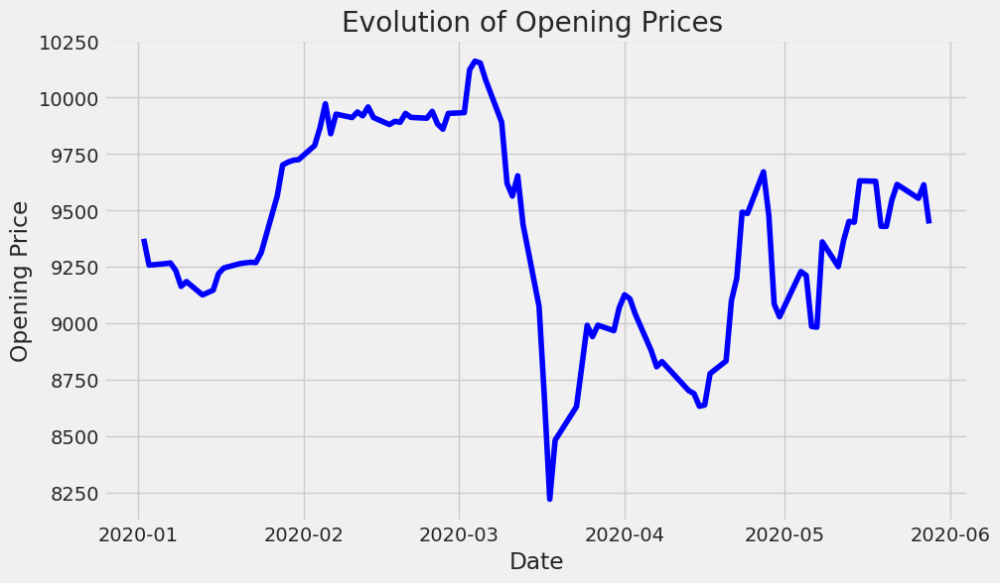

In [ ]:



# Select the first 50 rows
first_50_rows = combined_indexes.head(100)

# Create the plot
plt.figure(figsize=(10, 6))
plt.plot(first_50_rows['Date'], first_50_rows['Open'], color='blue')  # Assuming 'Open' is the column corresponding to opening prices
plt.title('Evolution of Opening Prices ')
plt.xlabel('Date')
plt.ylabel('Opening Price')
plt.grid(True)
plt.show()



# **Data Preparation**

Cheking for Outliers


In [ ]:

# Assuming 'data' is your DataFrame containing numerical columns
# Drop any non-numeric columns (e.g., datetime columns) from the DataFrame
data_numeric = combined_indexes.select_dtypes(include=['float64'])

# Calculate quartiles and IQR
Q1 = data_numeric.quantile(0.25)
Q3 = data_numeric.quantile(0.75)
IQR = Q3 - Q1

# Identify outliers using the IQR method
outliers = ((data_numeric < (Q1 - 1.5 * IQR)) | (data_numeric > (Q3 + 1.5 * IQR)))

# Count the number of outliers for each column
outliers_count = outliers.sum()

print("\nNombre de valeurs aberrantes par colonne :\n", outliers_count)



Nombre de valeurs aberrantes par colonne :
 High                     0
Close                    0
Low                      0
Open                     0
std_close                0
ROI                    955
7_Days_Average_ROI     623
ROI_Monthly_Avg         82
Kurtosis               750
Skewness              1000
yearly_std            1008
dtype: int64


as we can see we don't have any outliers in our combined indexes


In [ ]:
combined_index=combined_indexes.set_index('Date')


In [ ]:
combined_index.head()

,High,Close,Low,Open,Ind_Name,std_close,ROI,7_Days_Average_ROI,ROI_Monthly_Avg,Kurtosis,Skewness,yearly_std
Date,,,,,,,,,,,,
2020-01-02,9385.891,9258.853,9220.350,9374.647,TUNALIM,1136.849769,-1.235183,-0.236159,-0.115782,2.737252,-0.183288,830.67866
2020-01-03,9400.689,9355.501,9245.532,9257.826,TUNALIM,1136.849769,1.055053,-0.236159,-0.115782,2.737252,-0.183288,830.67866
2020-01-06,9410.592,9270.607,9264.979,9264.340,TUNALIM,1136.849769,0.067646,-0.236159,-0.115782,2.737252,-0.183288,830.67866
2020-01-07,9306.529,9234.977,9210.644,9267.688,TUNALIM,1136.849769,-0.352958,-0.236159,-0.115782,2.737252,-0.183288,830.67866
2020-01-08,9235.565,9158.477,9162.298,9234.124,TUNALIM,1136.849769,-0.819211,-0.236159,-0.115782,2.737252,-0.183288,830.67866


## **Feature Engineering**

The ROI is calculated as
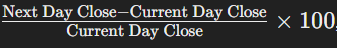 which gives the percentage increase or decrease in value if bought at the current day's close and sold at the next day's close.

In [ ]:
data_copy = combined_indexes.copy()
data_copy['ROI'] = ((data_copy['Close'] - data_copy['Open']) / data_copy['Open']) * 100

# Afficher les données avec le ROI calculé
print(data_copy)

            Date      High     Close       Low      Open Ind_Name  \
0     2020-01-02  9385.891  9258.853  9220.350  9374.647  TUNALIM   
1     2020-01-03  9400.689  9355.501  9245.532  9257.826  TUNALIM   
2     2020-01-06  9410.592  9270.607  9264.979  9264.340  TUNALIM   
3     2020-01-07  9306.529  9234.977  9210.644  9267.688  TUNALIM   
4     2020-01-08  9235.565  9158.477  9162.298  9234.124  TUNALIM   
...          ...       ...       ...       ...       ...      ...   
13423 2024-02-01  6405.802  6379.789  6358.646  6382.012   TUNFIN   
13424 2024-02-02  6382.145  6371.864  6351.213  6383.654   TUNFIN   
13425 2024-02-05  6375.804  6363.838  6347.672  6370.520   TUNFIN   
13426 2024-02-06  6370.620  6354.666  6330.714  6368.473   TUNFIN   
13427 2024-02-07  6367.051  6362.852  6323.823  6349.703   TUNFIN   

         std_close       ROI  7_Days_Average_ROI  ROI_Monthly_Avg  Kurtosis  \
0      1136.849769 -1.235183           -0.236159        -0.115782  2.737252   
1      1136.8

In [ ]:
data_copy.isnull().sum()

Date                  0
High                  0
Close                 0
Low                   0
Open                  0
Ind_Name              0
std_close             0
ROI                   0
7_Days_Average_ROI    0
ROI_Monthly_Avg       0
Kurtosis              0
Skewness              0
yearly_std            0
dtype: int64

###Now we will work on each Index Independently

In [ ]:
data = pd.read_csv('TUNCONS.csv', sep=';')
data.head()

,Date,High,Close,Low,Open,Ind_Name
0,02/01/2020,7458.104,7366.070,7358.880,7462.242,TUNCONS
1,03/01/2020,7446.325,7423.873,7343.159,7365.053,TUNCONS
2,06/01/2020,7453.627,7361.460,7358.632,7375.269,TUNCONS
3,07/01/2020,7382.254,7330.342,7307.633,7358.601,TUNCONS
4,08/01/2020,7362.236,7282.530,7281.058,7334.066,TUNCONS


In [ ]:
# Calculate the standard deviation (STD) for the 'Close'
data['std_close'] = data['Close'].std()

In [ ]:
data['ROI'] = ((data['Close'] - data['Open']) / data['Open']) * 100

In [ ]:
# Calculate the average ROI for each 7-day period
average_roi = data.groupby(data.index // 7)['ROI'].mean()

# Repeat the calculated average ROI for each row within that 7-day period
data['7_Days_Average_ROI'] = data.index.map(lambda x: average_roi[x // 7])

In [ ]:
data['Date'] = pd.to_datetime(data['Date'], format='%d/%m/%Y')

# Extract month from 'Date'
data['Month'] = data['Date'].dt.strftime('%B')  # %B returns the full month name

# Group by month and calculate average ROI for each month
average_roi_monthly = data.groupby('Month')['ROI'].mean().reset_index()

# Merge average ROI values back into the original DataFrame
data = pd.merge(data, average_roi_monthly, on='Month', suffixes=('', '_Monthly_Avg'))

In [ ]:
# Extract year, month, and day from 'Date'
data['Year'] = data['Date'].dt.year
data['Month'] = data['Date'].dt.strftime('%B')
data['Day'] = data['Date'].dt.day

# Create a custom sort order for months
month_order = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']

# Convert 'Month' to categorical with custom sort order
data['Month'] = pd.Categorical(data['Month'], categories=month_order, ordered=True)

# Sort the DataFrame by year, month, and day
data = data.sort_values(by=['Year', 'Month', 'Day'])
data.drop(['Year', 'Month','Day'], axis=1, inplace=True)


In [ ]:

# Iterate over each year from 2020 to 2024
for year in range(2020, 2025):
    # Filter data for the current year
    year_data = data[data['Date'].dt.year == year]

    # Filter data for the first quarter (January, February, and March)
    Q1_data = year_data[year_data['Date'].dt.month.isin([1, 2, 3])]

    # Filter data for the third quarter (July, August, and September)
    Q3_data = year_data[year_data['Date'].dt.month.isin([7, 8, 9])]

    # Calculate Q1 and Q3 of ROI for the current year and quarters
    Q1_ROI = Q1_data['ROI'].quantile(0.25) if not Q1_data.empty else None
    Q3_ROI = Q3_data['ROI'].quantile(0.75) if not Q3_data.empty else None

    # Print results
    print(f"For the year {year}:")
    print("Q1 ROI:", Q1_ROI)
    print("Q3 ROI:", Q3_ROI)
    print()


For the year 2020:
Q1 ROI: -0.38442714218448415
Q3 ROI: 0.4798294814505315

For the year 2021:
Q1 ROI: -0.35141730885140604
Q3 ROI: 0.25873767131079356

For the year 2022:
Q1 ROI: -0.43387690274683455
Q3 ROI: 0.4181941593276003

For the year 2023:
Q1 ROI: -0.4611502790437132
Q3 ROI: 0.10604194790741102

For the year 2024:
Q1 ROI: -0.7581104710765421
Q3 ROI: None



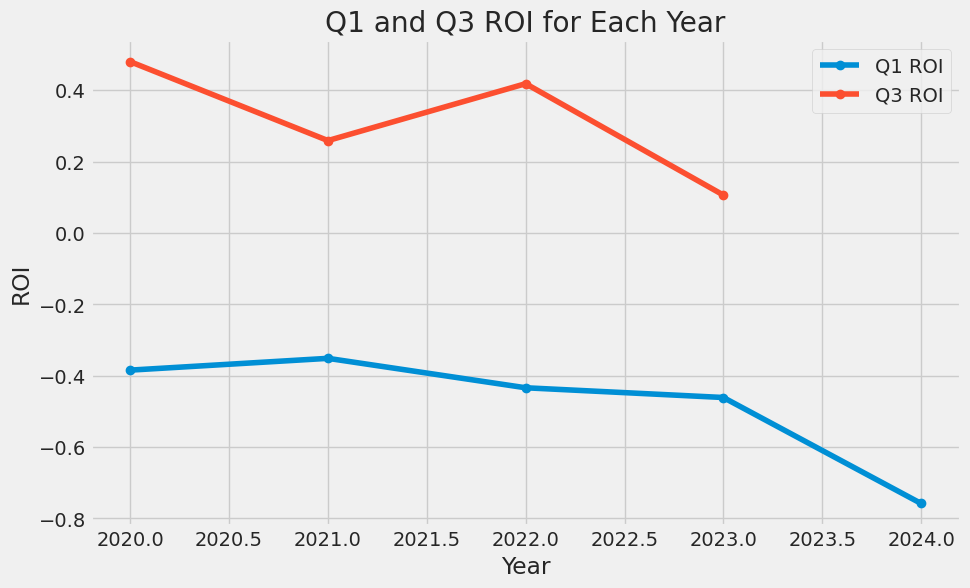

In [ ]:

# Initialize lists to store Q1 and Q3 ROI values
Q1_ROI_values = []
Q3_ROI_values = []

# Iterate over each year from 2020 to 2024
for year in range(2020, 2025):
    # Filter data for the current year
    year_data = data[data['Date'].dt.year == year]

    # Filter data for the first quarter (January, February, and March)
    Q1_data = year_data[year_data['Date'].dt.month.isin([1, 2, 3])]

    # Filter data for the third quarter (July, August, and September)
    Q3_data = year_data[year_data['Date'].dt.month.isin([7, 8, 9])]

    # Calculate Q1 and Q3 of ROI for the current year and quarters
    Q1_ROI = Q1_data['ROI'].quantile(0.25) if not Q1_data.empty else None
    Q3_ROI = Q3_data['ROI'].quantile(0.75) if not Q3_data.empty else None

    # Append Q1 and Q3 ROI values to lists
    Q1_ROI_values.append(Q1_ROI)
    Q3_ROI_values.append(Q3_ROI)

# Create a DataFrame to hold the Q1 and Q3 ROI values
df = pd.DataFrame({'Year': range(2020, 2025), 'Q1_ROI': Q1_ROI_values, 'Q3_ROI': Q3_ROI_values})

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(df['Year'], df['Q1_ROI'], marker='o', label='Q1 ROI')
plt.plot(df['Year'], df['Q3_ROI'], marker='o', label='Q3 ROI')
plt.xlabel('Year')
plt.ylabel('ROI')
plt.title('Q1 and Q3 ROI for Each Year')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
def Kurtosis(X):
    r"""
    Calculate the Square Root Kurtosis of a returns series.

    .. math::
        \text{Kurt}(X) = \left [ \frac{1}{T}\sum_{t=1}^{T}
        (X_{t} - \mathbb{E}(X_{t}))^{4} \right ]^{1/2}

    Parameters
    ----------
    X : 1d-array
        Returns series, must have Tx1 size.

    Raises
    ------
    ValueError
        When the value cannot be calculated.

    Returns
    -------
    value : float
        Square Root Kurtosis of a returns series.
    """

    a = np.array(X, ndmin=2)
    if a.shape[0] == 1 and a.shape[1] > 1:
        a = a.T
    if a.shape[0] > 1 and a.shape[1] > 1:
        raise ValueError("returns must have Tx1 size")

    T, N = a.shape
    mu = np.mean(a, axis=0).reshape(1, -1)
    mu = np.repeat(mu, T, axis=0)
    value = mu - a
    value = np.sum(np.power(value, 4)) / T
    value = np.power(value, 0.5).item()

    return value

# Assuming your returns data is in a DataFrame named 'data' and the column containing returns is named 'ROI'
for year in range(2020, 2025):
    year_data = data[data['Date'].dt.year == year]
    returns = year_data['ROI']
    kurtosis_value = Kurtosis(returns)
    print(f"Square Root Kurtosis for {year}: {kurtosis_value}")


Square Root Kurtosis for 2020: 2.539925478118118
Square Root Kurtosis for 2021: 0.5774356228464232
Square Root Kurtosis for 2022: 0.9541333819298484
Square Root Kurtosis for 2023: 1.5859837661721008
Square Root Kurtosis for 2024: 0.832716718673299


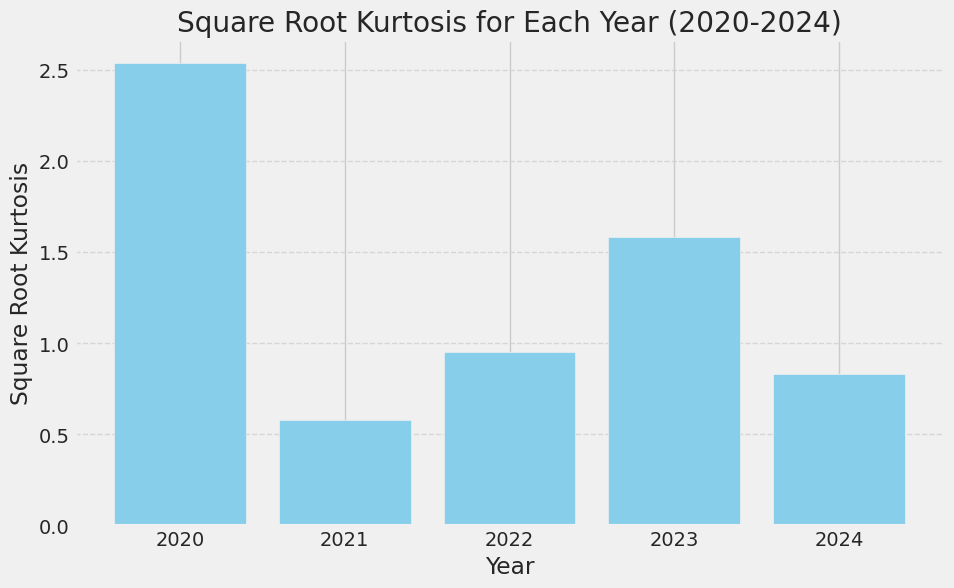

In [ ]:
kurtosis_values = []
years = []

# Assuming your returns data is in a DataFrame named 'data' and the column containing returns is named 'ROI'
for year in range(2020, 2025):
    year_data = data[data['Date'].dt.year == year]
    returns = year_data['ROI']
    kurtosis_value = Kurtosis(returns)
    kurtosis_values.append(kurtosis_value)
    years.append(year)

plt.bar(years, kurtosis_values, color='skyblue')
plt.xlabel('Year')
plt.ylabel('Square Root Kurtosis')
plt.title('Square Root Kurtosis for Each Year (2020-2024)')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
import pandas as pd
import numpy as np

def Kurtosis(X):
    """
    Calculate the Square Root Kurtosis of a returns series.

    Parameters
    ----------
    X : array-like
        Returns series, must have a size of Tx1.

    Raises
    ------
    ValueError
        When the input data has the wrong shape.

    Returns
    -------
    value : float
        Square Root Kurtosis of a returns series.
    """
    # Ensure input is 2D array-like
    a = np.array(X, ndmin=2)
    if a.shape[0] == 1 and a.shape[1] > 1:
        a = a.T
    if a.shape[0] > 1 and a.shape[1] > 1:
        raise ValueError("returns must have Tx1 size")

    # Calculate the fourth central moment
    T = len(X)
    mu = np.mean(X)
    central_moment_4 = np.mean((X - mu)**4)

    # Calculate the square root of the kurtosis
    kurtosis_value = np.sqrt(central_moment_4)

    return kurtosis_value

# Create a DataFrame to store Kurtosis values
kurtosis_df = pd.DataFrame(columns=['Year', 'Kurtosis'])

# Iterate over each year from 2020 to 2024
for year in range(2020, 2025):
    # Filter data for the current year
    year_data = data[data['Date'].dt.year == year]

    # Calculate Kurtosis for the returns of the current year
    returns = year_data['ROI']
    kurtosis_value = Kurtosis(returns)

    # Create a new DataFrame for the current year's Kurtosis
    new_row = pd.DataFrame({'Year': [year], 'Kurtosis': [kurtosis_value]})

    # Concatenate the new row with the existing DataFrame
    kurtosis_df = pd.concat([kurtosis_df, new_row], ignore_index=True)

# Merge the Kurtosis DataFrame with the original DataFrame based on the year
data = pd.merge(data, kurtosis_df, how='left', left_on=data['Date'].dt.year, right_on='Year')

# Drop the redundant columns
#data.drop(columns=['Year_y'], inplace=True)
#data.rename(columns={'Year_x': 'Year'}, inplace=True)


In [ ]:
#data.drop(columns=[ 'Kurtosis_x'], inplace=True)

#data.rename(columns={'Kurtosis_y': 'Kurtosis'}, inplace=True)

In [ ]:
from scipy.stats import skew
import pandas as pd

# Create a DataFrame to store skewness values
skewness_df = pd.DataFrame(columns=['Year', 'Skewness'])

# Iterate over each year from 2020 to 2024
for year in range(2020, 2025):
    # Filter data for the current year
    year_data = data[data['Date'].dt.year == year]

    # Calculate skewness for the returns of the current year
    skewness_value = skew(year_data['ROI'], bias=True)

    # Create a new DataFrame for the current year's skewness
    new_row = pd.DataFrame({'Year': [year], 'Skewness': [skewness_value]})

    # Concatenate the new row with the existing DataFrame
    skewness_df = pd.concat([skewness_df, new_row], ignore_index=True)

# Merge the skewness DataFrame with the original DataFrame based on the year
# First, remove any existing 'Year' column in data to avoid conflict
data = data.drop(columns=['Year'], errors='ignore')

# Now, perform the merge using the left_on and right_on parameters
data = pd.merge(data, skewness_df, how='left', left_on=data['Date'].dt.year, right_on='Year')

# Drop the redundant 'Year' column in the merged data
data.drop(columns=['Year'], inplace=True)


In [ ]:
# Extract the year from the 'Date' column
data['Year'] = data['Date'].dt.year

# Define a function to calculate yearly standard deviation
def calculate_yearly_std(group):
    group['yearly_std'] = group['Close'].std()
    return group

# Apply the function to each group and create a new column 'yearly_std'
data = data.groupby('Year').apply(calculate_yearly_std)

data.drop(columns=[ 'Year'], inplace=True)

## Distribution of the new features

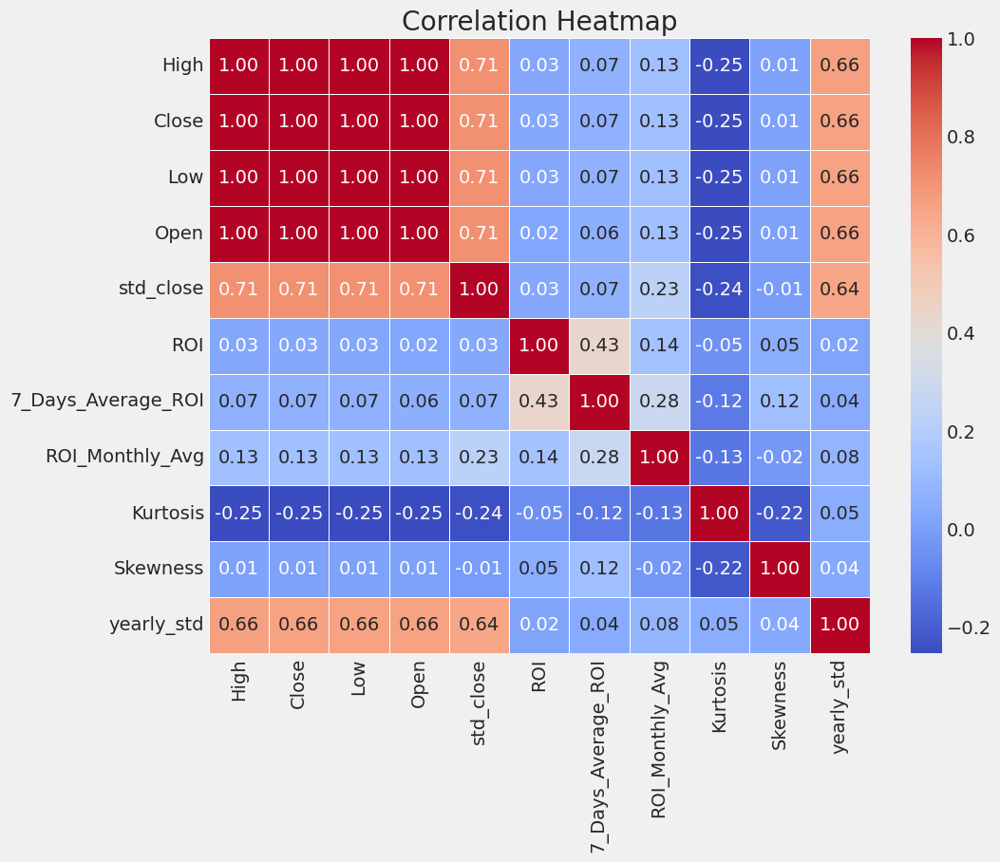

In [ ]:


# Filter the DataFrame to include only numeric columns
numeric_data = combined_indexes.select_dtypes(include=[np.number])

# Calculate the correlation matrix for the numeric data
correlation_matrix = numeric_data.corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Heatmap')
plt.show()


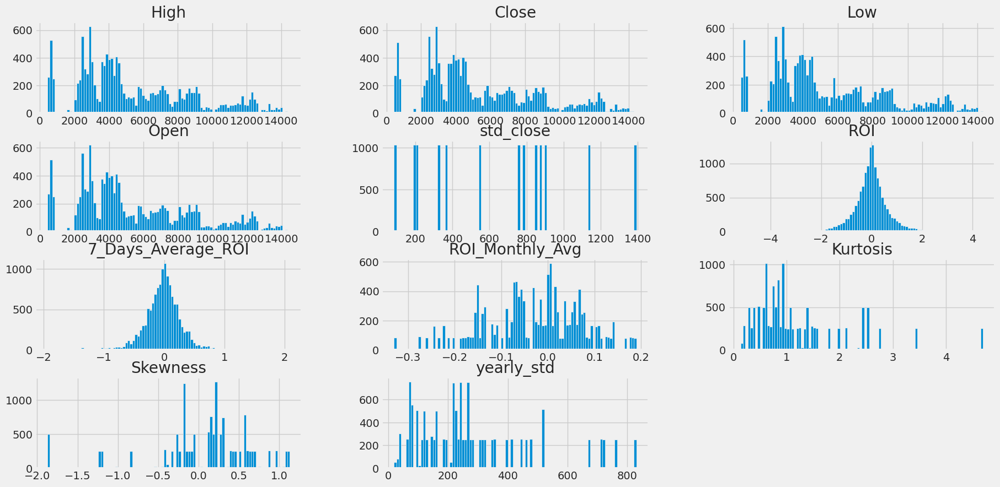

In [ ]:
combined_index.hist(figsize=(20,10), bins=100); #bins pour preciser l intervale des histo

In [ ]:


# Liste unique des entreprises
valeurs_uniques = data_copy['Ind_Name'].unique()

# Tracer les graphiques pour chaque entreprise
for valeur in valeurs_uniques:
    # Filtrer le DataFrame pour l'entreprise actuelle
    df_valeur = data_copy[data_copy['Ind_Name'] == valeur]

    # Création du graphique pour ROI
    fig = go.Figure()

    # Ajout de la trace pour ROI
    fig.add_trace(go.Scatter(x=df_valeur.index, y=df_valeur['ROI'], name='ROI'))

    # Mise à jour des mises en page du graphique
    fig.update_layout(
        title=f'ROI pour {valeur}',
        xaxis_title='Date',
        yaxis_title='ROI',
        width=1000,  # Largeur de la figure
        height=600   # Hauteur de la figure
    )

    # Affichage du graphique
    fig.show()

In [ ]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Create a subplot for each feature
fig = make_subplots(rows=4, cols=2, subplot_titles=('std_close', 'ROI', '7_Days_Average_ROI',
                                                    'ROI_Monthly_Avg', 'Kurtosis', 'Skewness',
                                                    'yearly_std'))

# Add traces for each feature
fig.add_trace(go.Scatter(x=data_copy.index, y=data_copy['std_close'], mode='lines', name='std_close'), row=1, col=1)
fig.add_trace(go.Scatter(x=data_copy.index, y=data_copy['ROI'], mode='lines', name='ROI'), row=1, col=2)
fig.add_trace(go.Scatter(x=data_copy.index, y=data_copy['7_Days_Average_ROI'], mode='lines', name='7_Days_Average_ROI'), row=2, col=1)
fig.add_trace(go.Scatter(x=data_copy.index, y=data_copy['ROI_Monthly_Avg'], mode='lines', name='ROI_Monthly_Avg'), row=2, col=2)
fig.add_trace(go.Scatter(x=data_copy.index, y=data_copy['Kurtosis'], mode='lines', name='Kurtosis'), row=3, col=1)
fig.add_trace(go.Scatter(x=data_copy.index, y=data_copy['Skewness'], mode='lines', name='Skewness'), row=3, col=2)
fig.add_trace(go.Scatter(x=data_copy.index, y=data_copy['yearly_std'], mode='lines', name='yearly_std'), row=4, col=1)

# Update layout
fig.update_layout(title='Variation of Numerical Features over Time',
                  xaxis_title='Date',
                  height=1000, width=1000)

# Show plot
fig.show()


In [ ]:


# Chargez vos données de série temporelle dans le DataFrame combined_indexes
# Assurez-vous que vos données ont une colonne 'Date' et des colonnes pour les prix (High, Low, Close, Open)
# combined_indexes = pd.read_csv('votre_fichier.csv')

# Etape 1: Exploration des données (EDA)
# Visualiser les tendances des prix (High, Low, Close, Open) pour chaque valeur unique de 'Ind_Name'
for index_name in combined_indexes['Ind_Name'].unique():
    # Filtrer les données pour le 'Ind_Name' actuel
    data_subset = combined_indexes[combined_indexes['Ind_Name'] == index_name]

    # Créer une figure pour chaque 'Ind_Name'
    fig = go.Figure()

    # Ajouter des traces pour les prix High, Low, Close et Open
    fig.add_trace(go.Scatter(x=data_subset['Date'], y=data_subset['ROI'], mode='lines', name='ROI'))
    fig.add_trace(go.Scatter(x=data_subset['Date'], y=data_subset['7_Days_Average_ROI'], mode='lines', name='7_Days_Average_ROI'))
    fig.add_trace(go.Scatter(x=data_subset['Date'], y=data_subset['ROI_Monthly_Avg'], mode='lines', name='ROI_Monthly_Avg'))
    fig.add_trace(go.Scatter(x=data_subset['Date'], y=data_subset['yearly_std'], mode='lines', name='yearly_std'))

    # Mettre à jour la disposition de la figure
    fig.update_layout(title=f"Price Trends for {index_name}",
                      xaxis_title='Date',
                      yaxis_title='Price')

    # Afficher le graphique
    fig.show()



## **Encoding**

In [ ]:
data_preparation= data_copy.copy()

In [ ]:
from sklearn.preprocessing import LabelEncoder
# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the 'Ind_Name' column
data_preparation['Ind_Name_Encoded'] = label_encoder.fit_transform(data_preparation['Ind_Name']) + 1  # Adding 1 to start mapping from 1 instead of 0

# Print the mapping of encoded values to original labels
print("Mapping of encoded values to original labels:")
for label, encoded_value in zip(label_encoder.classes_, range(1, len(label_encoder.classes_) + 1)):
    print(f"{label}: {encoded_value}")



Mapping of encoded values to original labels:
TUNALIM: 1
TUNASS: 2
TUNBANK: 3
TUNBASE: 4
TUNBATIM: 5
TUNCONS: 6
TUNDIS: 7
TUNFIN: 8
TUNINDEX: 9
TUNINDEX"20": 10
TUNINPMP: 11
TUNSAC: 12
TUNSEFI: 13


In [ ]:
data_preparation.drop(['Ind_Name'], axis=1, inplace=True)

In [ ]:
data_preparation.columns

Index(['Date', 'High', 'Close', 'Low', 'Open', 'std_close', 'ROI',
       '7_Days_Average_ROI', 'ROI_Monthly_Avg', 'Kurtosis', 'Skewness',
       'yearly_std', 'Ind_Name_Encoded'],
      dtype='object')

## **Normalization and Scaling**

**NORMALIZATION**

Model type :Neural Network

Stationarity : Time series data often needs to be stationary for accurate predictions. Stationarity means that the data's statistical properties (such as mean, variance, and autocorrelation) remain constant over time. Normalization itself doesn't make a time series stationary, but it can be combined with techniques like differencing or transformation (e.g., log or square root) to achieve stationarity.

Comparability: If you want to compare time series data from different sources or units, normalization can help put them on the same scale and make comparisons more meaningful.

In [ ]:
data_preparation['7_Days_Average_ROI'].unique()


array([-0.23615908, -0.0101742 ,  0.49745554, ...,  0.01342315,
        0.00239253, -0.07482542])

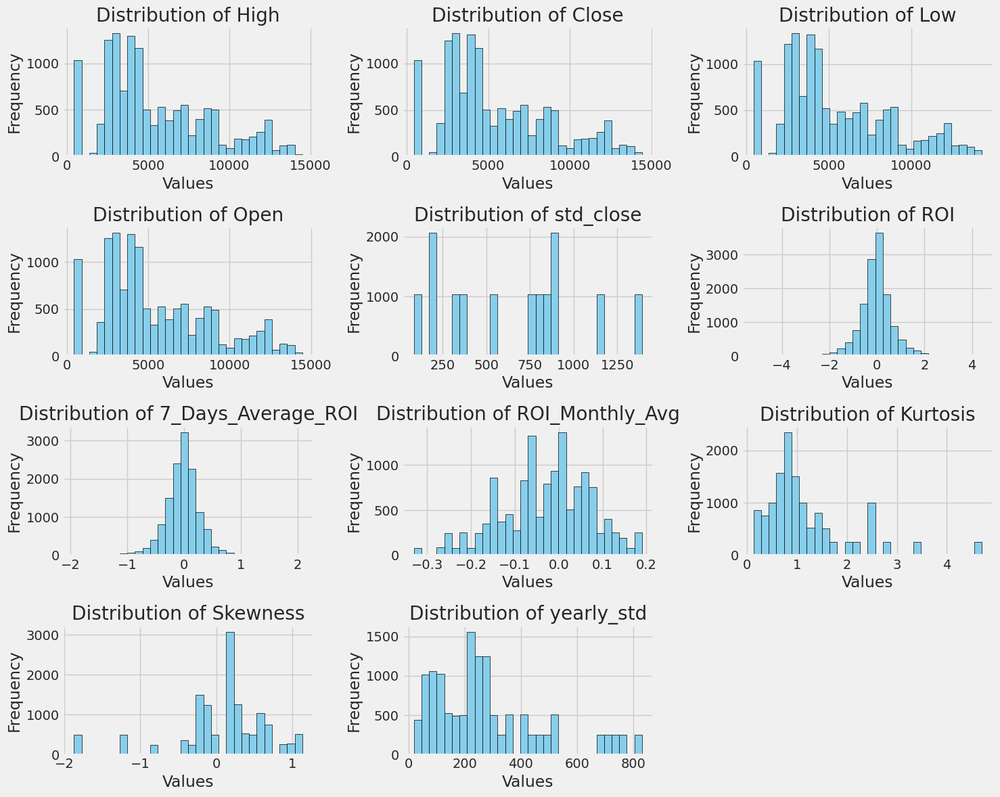

In [ ]:
import matplotlib.pyplot as plt

# Assuming combined_indexes is your DataFrame containing the data
features = ['High', 'Close', 'Low', 'Open', 'std_close', 'ROI', '7_Days_Average_ROI', 'ROI_Monthly_Avg', 'Kurtosis', 'Skewness', 'yearly_std']

plt.figure(figsize=(15, 12))
for i, feature in enumerate(features, start=1):
    plt.subplot(4, 3, i)
    plt.hist(data_preparation[feature], bins=30, color='skyblue', edgecolor='black')
    plt.title('Distribution of {}'.format(feature))
    plt.xlabel('Values')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


In [ ]:
from sklearn.preprocessing import MinMaxScaler


# Select the columns you want to normalize
columns_to_normalize = ['High', 'Close', 'Low', 'Open', 'std_close', 'ROI',
                         '7_Days_Average_ROI', 'ROI_Monthly_Avg', 'Kurtosis',
                         'Skewness', 'yearly_std']  # Add more columns as needed

# Create a MinMaxScaler object
scaler = MinMaxScaler(feature_range=(-1, 1))

# Fit and transform the selected columns
data_preparation[columns_to_normalize] = scaler.fit_transform(data_preparation[columns_to_normalize])



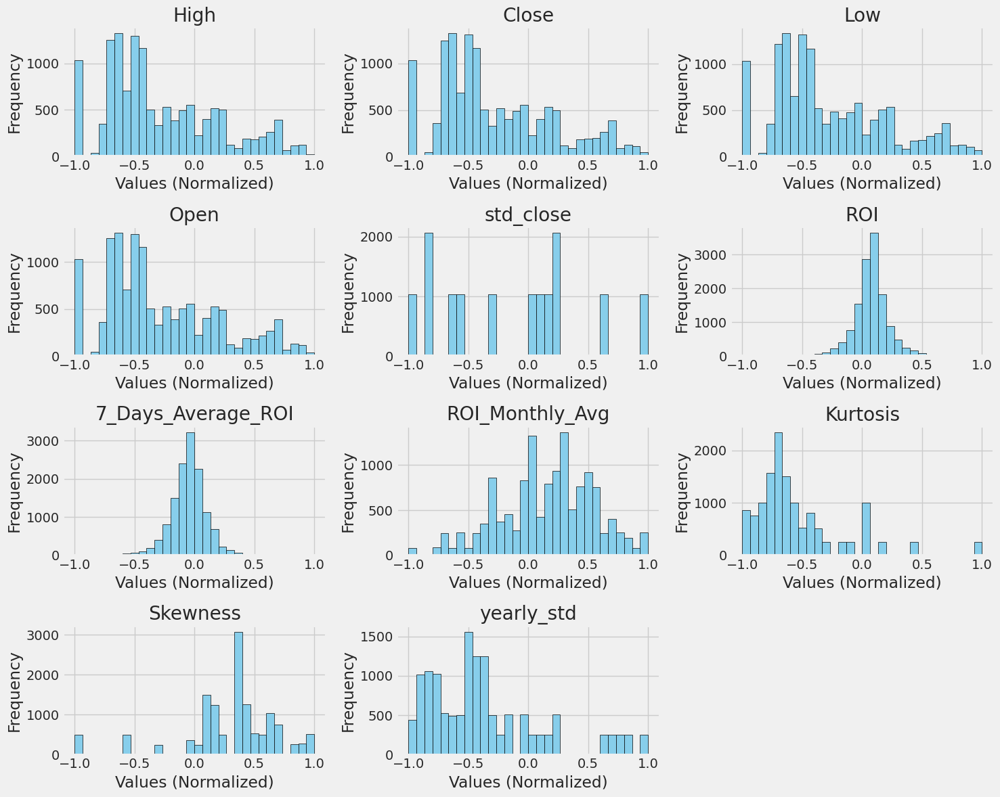

In [ ]:
# Visualize the normalized data
plt.figure(figsize=(15, 12))
for i, feature in enumerate(columns_to_normalize, start=1):
    plt.subplot(4, 3, i)
    plt.hist(data_preparation[feature], bins=30, color='skyblue', edgecolor='black')
    plt.title('{}'.format(feature))
    plt.xlabel('Values (Normalized)')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()




In [ ]:
data_preparation.head()

,Date,High,Close,Low,Open,std_close,ROI,7_Days_Average_ROI,ROI_Monthly_Avg,Kurtosis,Skewness,yearly_std,Ind_Name_Encoded
0,2020-01-02,0.272510,0.260557,0.267577,0.274448,0.609207,-0.175813,-0.153979,-0.174867,0.140629,0.124765,1.0,1
1,2020-01-03,0.274613,0.274359,0.271207,0.257799,0.609207,0.301159,-0.153979,-0.174867,0.140629,0.124765,1.0,1
2,2020-01-06,0.276021,0.262235,0.274010,0.258727,0.609207,0.095519,-0.153979,-0.174867,0.140629,0.124765,1.0,1
3,2020-01-07,0.261227,0.257147,0.266179,0.259204,0.609207,0.007922,-0.153979,-0.174867,0.140629,0.124765,1.0,1
4,2020-01-08,0.251138,0.246222,0.259211,0.254421,0.609207,-0.089182,-0.153979,-0.174867,0.140629,0.124765,1.0,1


## **PCA**

# **Modeling**

In [ ]:
def mean_absolute_percentage_error(y_test, y_pred):
    y_test, y_pred = np.array(y_test), np.array(y_pred)
    return np.mean(np.abs((y_test - y_pred) / y_test)) * 100

## **Univariate time series Forecasting**

###  Trends, seasonality and noise

In [ ]:


# Assurez-vous que la colonne 'Date' est au format datetime et triée
data_preparation.sort_values('Date', inplace=True)

# Grouper les données par 'Ind_Name'
grouped = data_preparation.groupby('Ind_Name_Encoded')

for name, group in grouped:
    # Appliquer la décomposition saisonnière
    decomposition = seasonal_decompose(group.set_index('Date')['Close'], model='additive', period=100)

    # Créer des graphiques Plotly pour chaque composant de la décomposition
    fig = make_subplots(rows=4, cols=1, shared_xaxes=True, subplot_titles=('Observé', 'Tendance', 'Saisonnalité', 'Résidu'))

    # Observé
    fig.add_trace(go.Scatter(x=group['Date'], y=decomposition.observed, mode='lines', name='Observé'), row=1, col=1)
    # Tendance
    fig.add_trace(go.Scatter(x=group['Date'], y=decomposition.trend, mode='lines', name='Tendance'), row=2, col=1)
    # Saisonnalité
    fig.add_trace(go.Scatter(x=group['Date'], y=decomposition.seasonal, mode='lines', name='Saisonnalité'), row=3, col=1)
    # Résidu
    fig.add_trace(go.Scatter(x=group['Date'], y=decomposition.resid, mode='lines', name='Résidu'), row=4, col=1)

    # Mise à jour des mises en page
    fig.update_layout(height=800, width=1000, title_text=f"Décomposition saisonnière pour : {name}")
    fig.show()


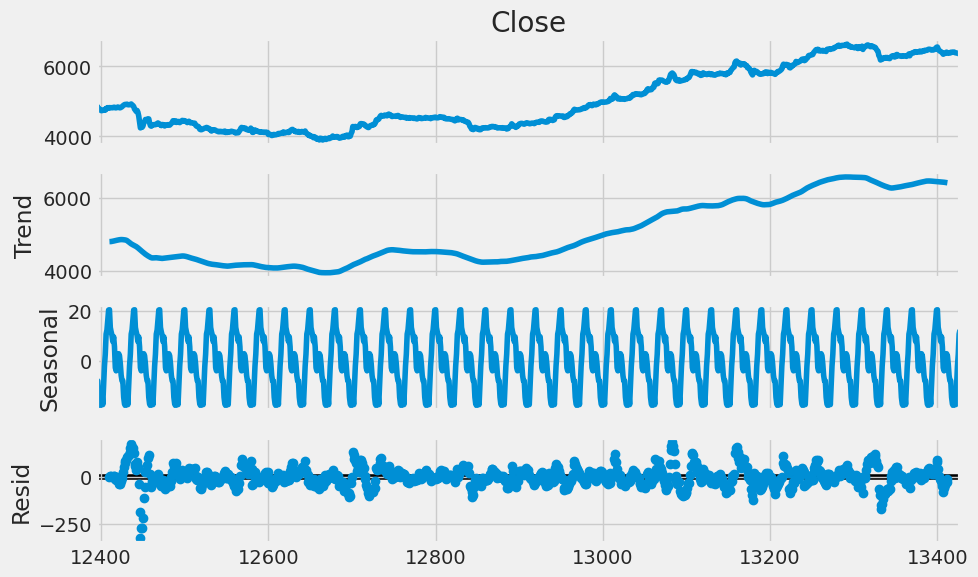

In [ ]:


# Décomposition saisonnière des prix de clôture
decomposition = seasonal_decompose(data_subset['Close'], model='additive', period=30)  # Période saisonnière de 30 jours, à ajuster selon vos données

# Tracé de la décomposition saisonnière
decomposition.plot()
plt.show()


In [ ]:


# Generate some sample data
np.random.seed(0)
X = np.random.randn(100, 2)
y = X.dot(np.array([1, 2])) + np.random.normal(0, 1, 100)

# Fit a linear regression model
X_with_const = sm.add_constant(X)  # Add constant term
model = sm.OLS(y, X_with_const)
model_fit = model.fit()

# Get standardized residuals
residuals = model_fit.resid / model_fit.resid.std()

# Graph of standardized residuals
fig = go.Figure()
fig.add_trace(go.Scatter(y=residuals, mode='lines', name='Standardized Residuals'))
fig.update_layout(title='Standardized Residuals Plot', xaxis_title='Index', yaxis_title='Standardized Residuals')
fig.show()


### ACF

<Figure size 1200x600 with 0 Axes>

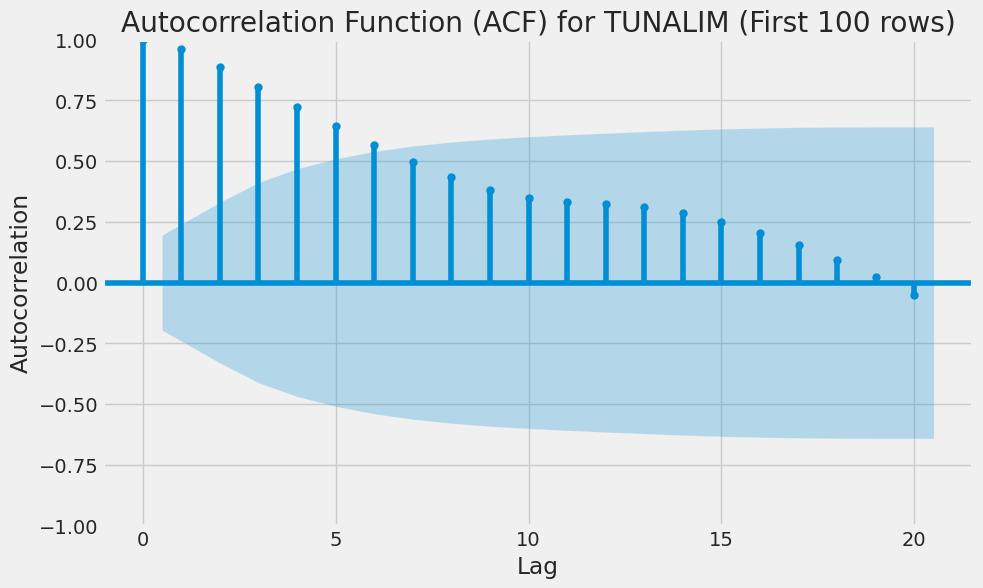

<Figure size 1200x600 with 0 Axes>

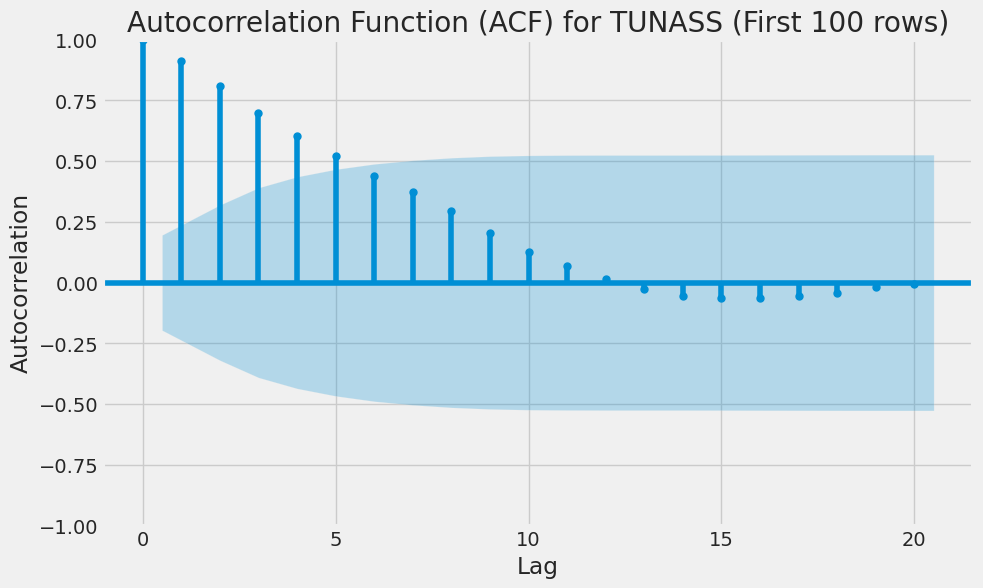

<Figure size 1200x600 with 0 Axes>

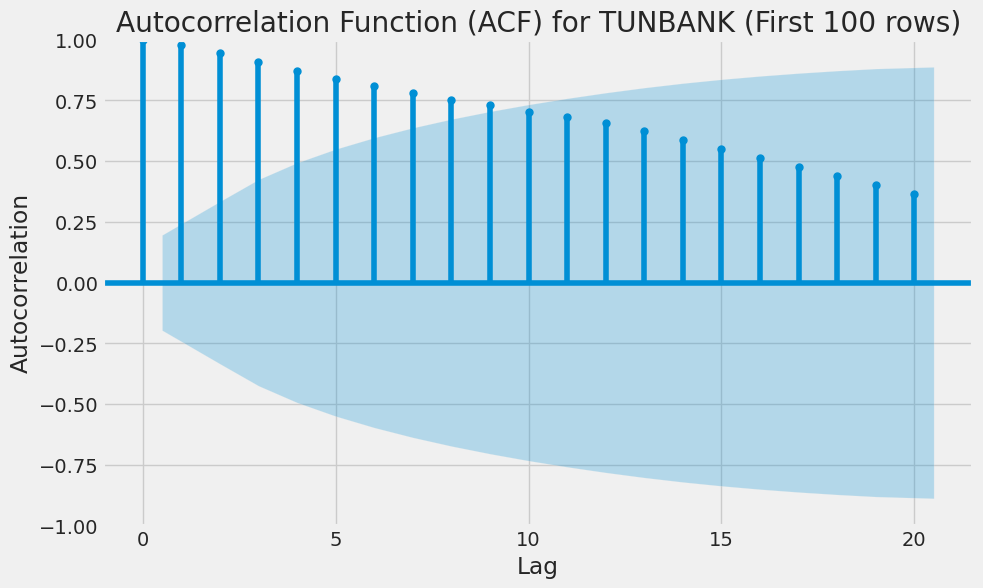

<Figure size 1200x600 with 0 Axes>

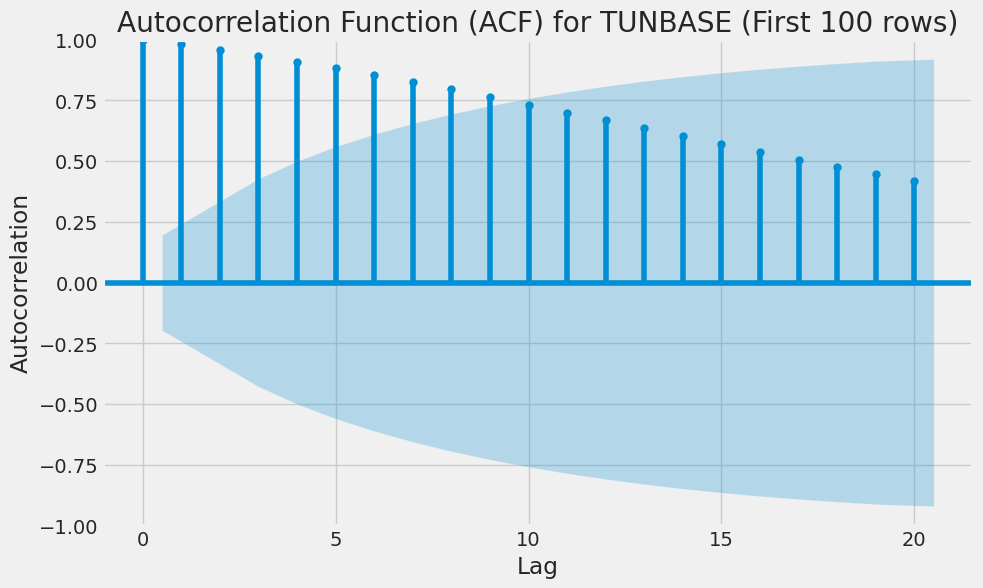

<Figure size 1200x600 with 0 Axes>

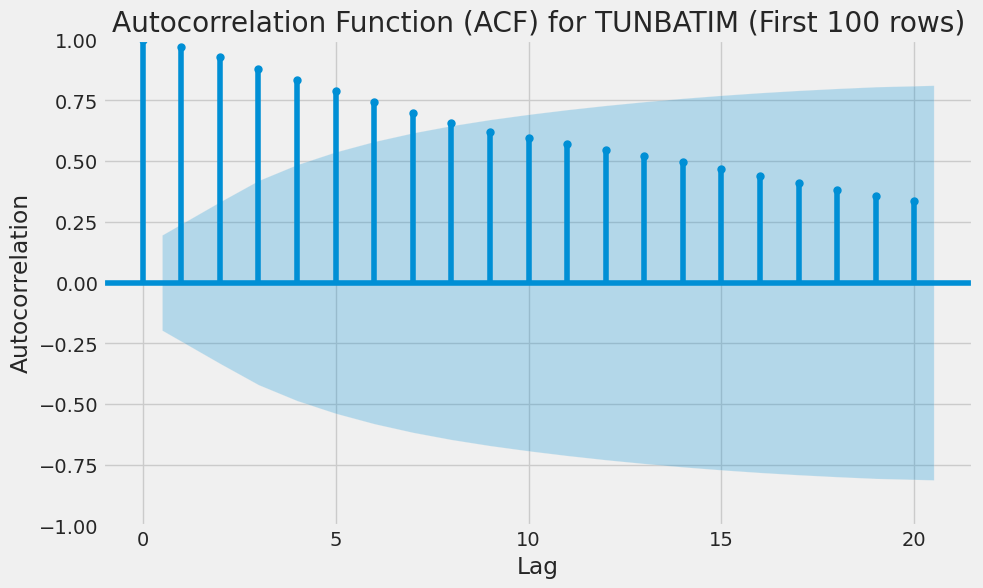

<Figure size 1200x600 with 0 Axes>

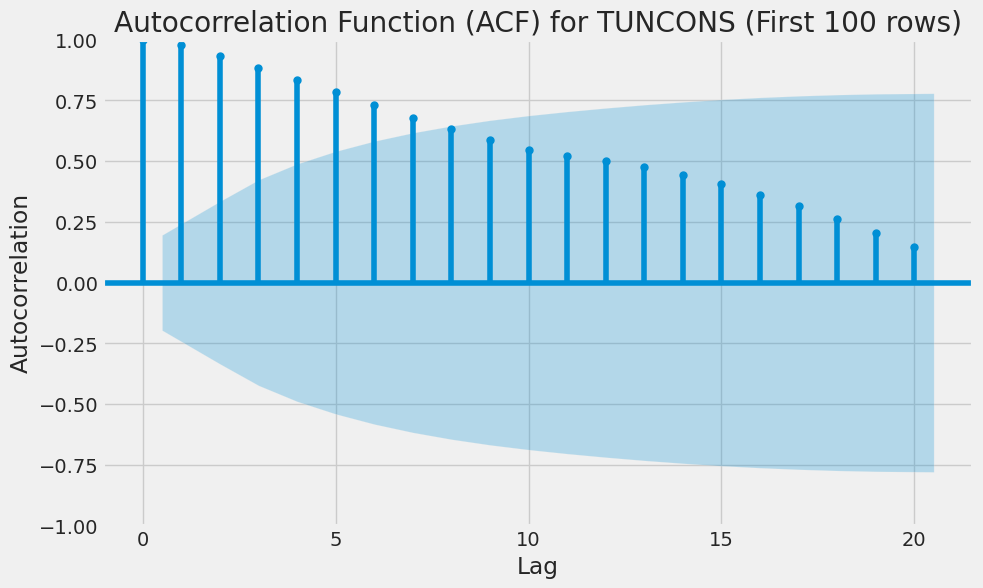

<Figure size 1200x600 with 0 Axes>

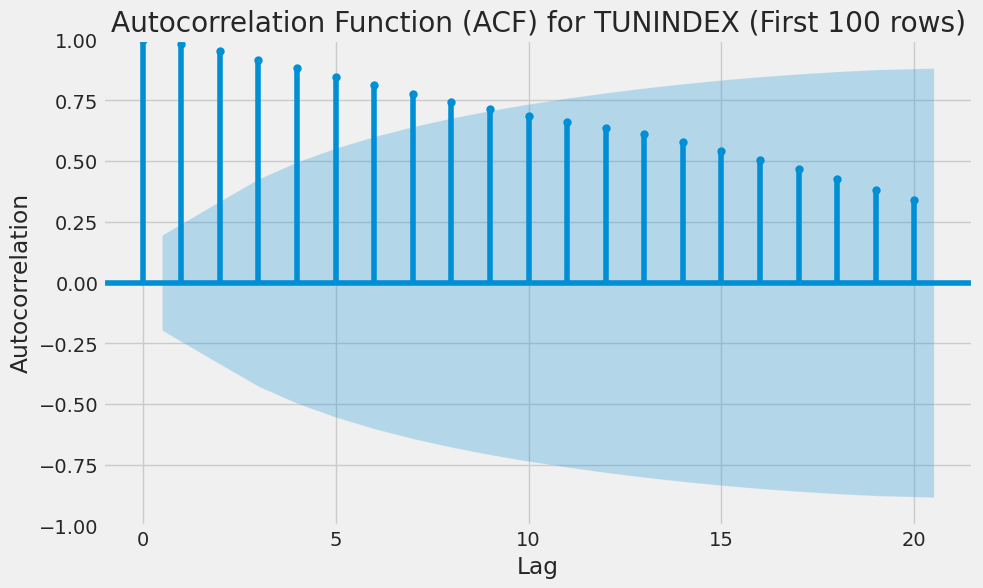

<Figure size 1200x600 with 0 Axes>

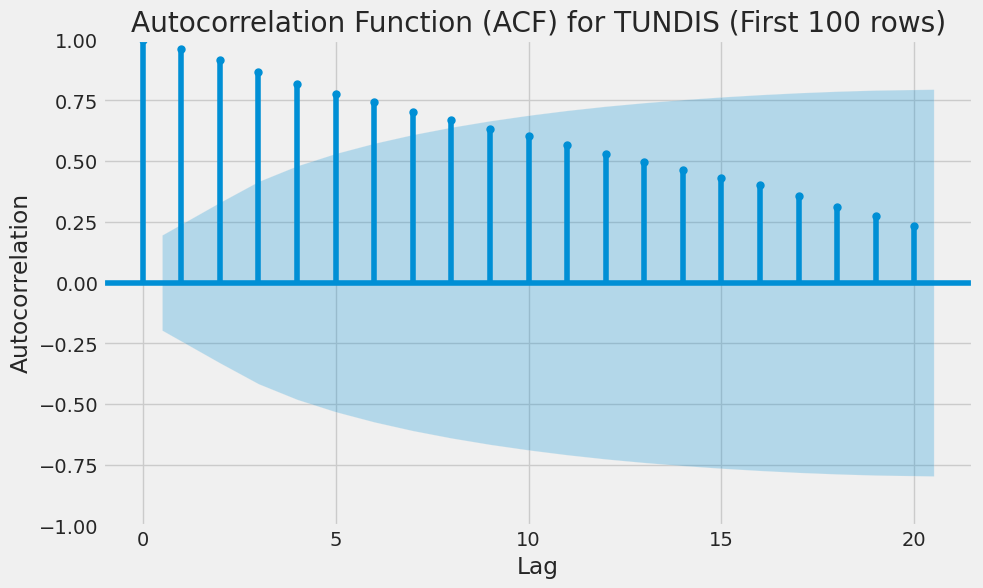

<Figure size 1200x600 with 0 Axes>

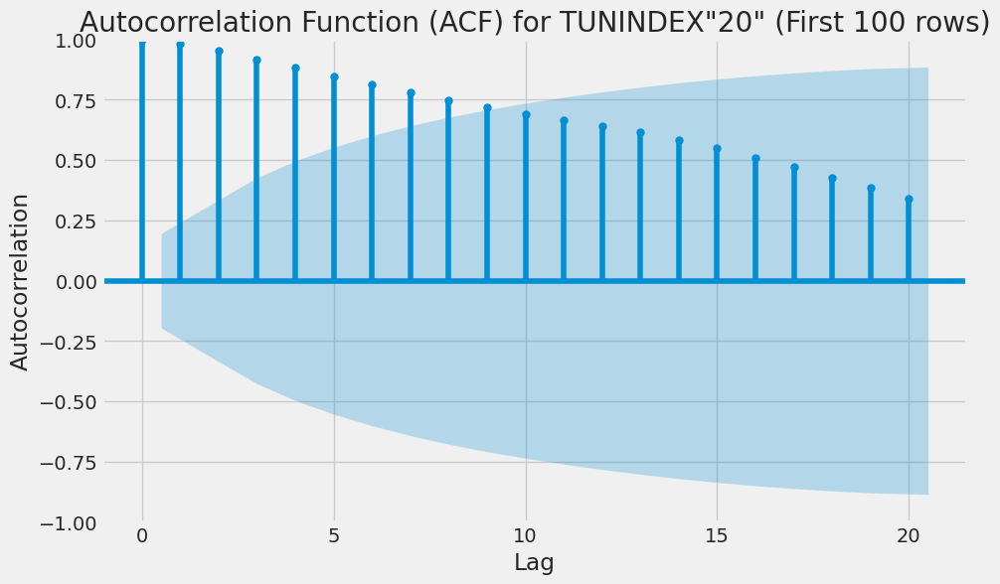

<Figure size 1200x600 with 0 Axes>

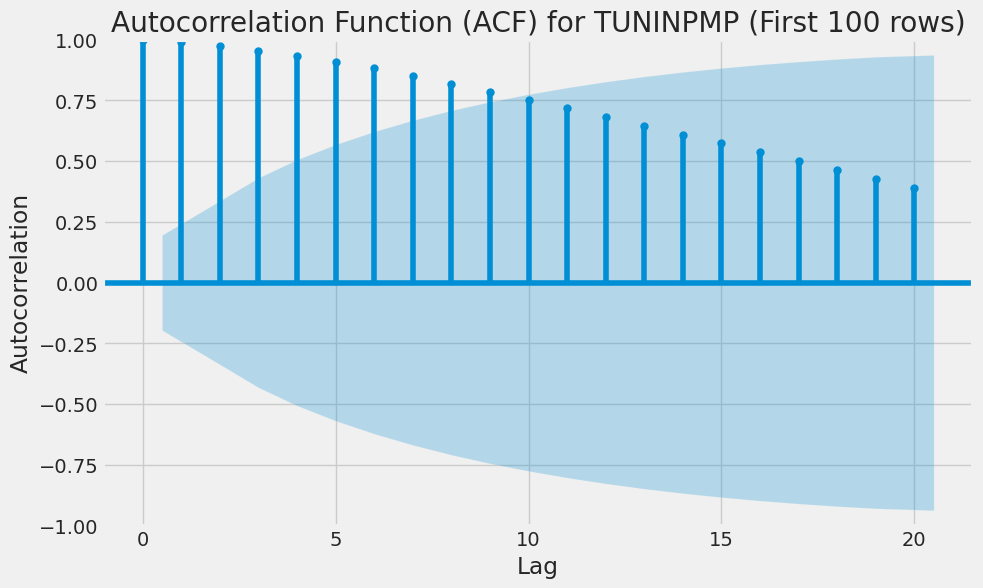

<Figure size 1200x600 with 0 Axes>

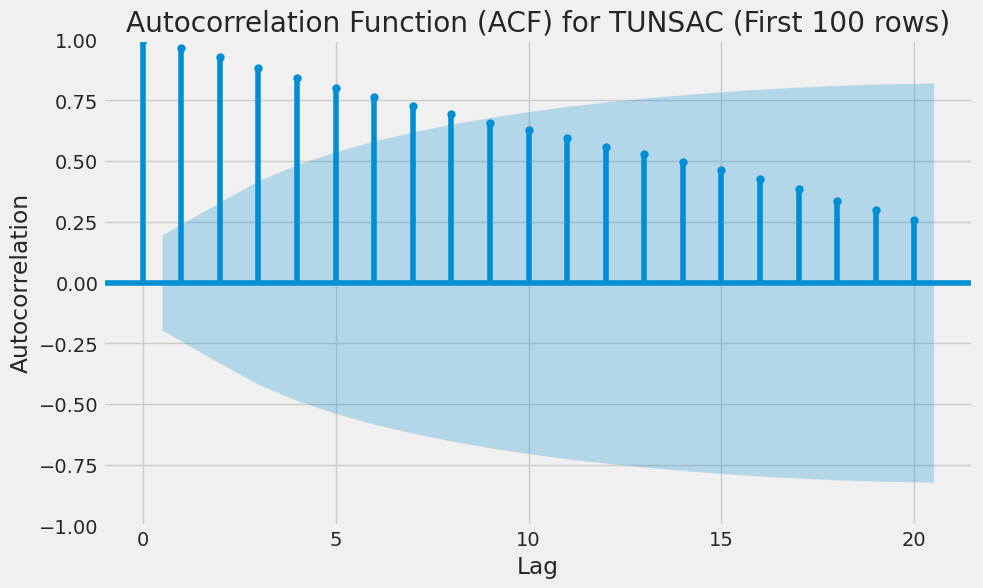

<Figure size 1200x600 with 0 Axes>

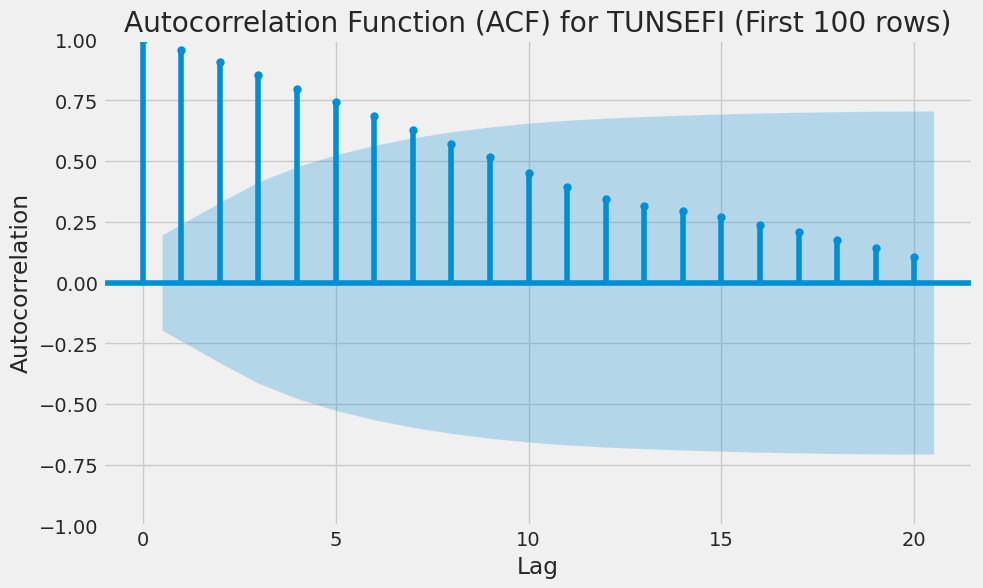

<Figure size 1200x600 with 0 Axes>

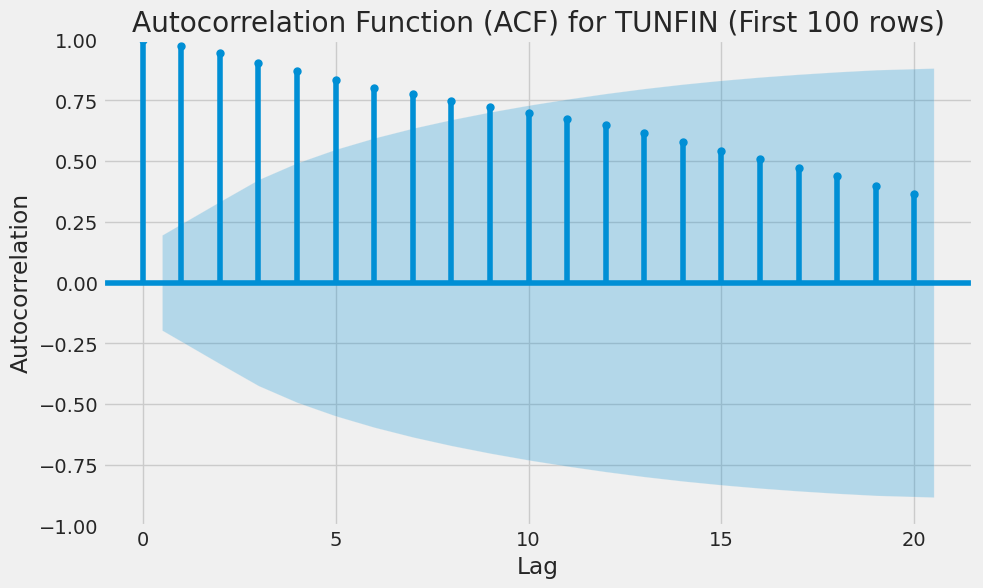

In [ ]:


# Iterate over unique values in the 'Ind_Name' column
for index_name in combined_indexes['Ind_Name'].unique():
    # Filter data for the current value of 'Ind_Name'
    index_data = combined_indexes[combined_indexes['Ind_Name'] == index_name]['Close'][:100]  # Select the first 100 rows

    # Plot the autocorrelation function (ACF) for the current value of 'Ind_Name'
    plt.figure(figsize=(12, 6))
    plot_acf(index_data)  # Adjust the number of lags as needed
    plt.title(f'Autocorrelation Function (ACF) for {index_name} (First 100 rows)')
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.grid(True)
    plt.show()



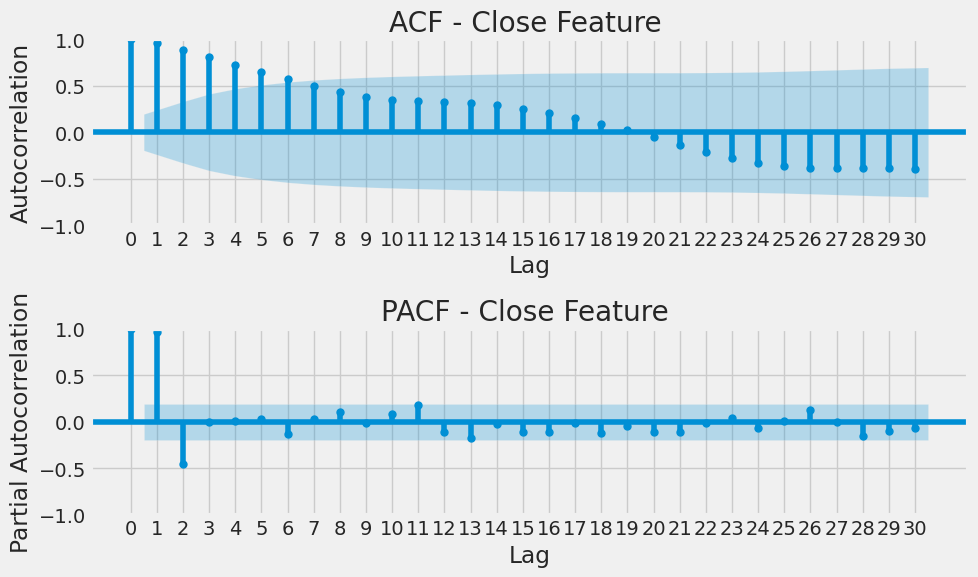

In [ ]:


# Select the first 100 rows
subset_data = combined_indexes.head(100)

# Create the subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6))

# Plot the ACF
plot_acf(subset_data['Close'], lags=30, zero=True, ax=ax1)
ax1.set_title('ACF - Close Feature ')
ax1.set_xlabel('Lag')
ax1.set_ylabel('Autocorrelation')
ax1.grid(True)

# Adjust x-axis ticks for ACF
ax1.set_xticks(range(0, 31, 1))

# Plot the PACF
plot_pacf(subset_data['Close'], lags=30, zero=True, ax=ax2)
ax2.set_title('PACF - Close Feature ')
ax2.set_xlabel('Lag')
ax2.set_ylabel('Partial Autocorrelation')
ax2.grid(True)

# Adjust x-axis ticks for PACF
ax2.set_xticks(range(0, 31, 1))

# Adjust subplots
plt.tight_layout()

# Show the plot
plt.show()


In [ ]:



# Sélection des 100 premières lignes pour l'exemple
subset_data = combined_indexes.head(100)

# Calcul de l'ACF et du PACF
acf_values = acf(subset_data['Close'], nlags=30)
pacf_values = pacf(subset_data['Close'], nlags=30)

# Création du graphique ACF avec Plotly
fig_acf = go.Figure()
fig_acf.add_trace(go.Bar(x=list(range(len(acf_values))), y=acf_values))
fig_acf.update_layout(
    title='ACF - Close Feature',
    xaxis_title='Lag',
    yaxis_title='Autocorrelation',
    template='plotly_white',
    width=800,  # Ajuster la largeur
    height=300   # Ajuster la hauteur
)

# Création du graphique PACF avec Plotly
fig_pacf = go.Figure()
fig_pacf.add_trace(go.Bar(x=list(range(len(pacf_values))), y=pacf_values))
fig_pacf.update_layout(
    title='PACF - Close Feature',
    xaxis_title='Lag',
    yaxis_title='Partial Autocorrelation',
    template='plotly_white',
    width=800,  # Ajuster la largeur
    height=300   # Ajuster la hauteur
)

# Affichage des graphiques
fig_acf.show()
fig_pacf.show()


### Augmented Dickey-Fuller test

Test whether the time series is stationary using statistical tests like the Augmented Dickey-Fuller (ADF) test.
If the time series is stationary, proceed with modeling. Otherwise, continue to the differentiation step.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller

# Iterate over each unique value in the 'Ind_Name_Encoded' column
for ind_encoded in data_preparation['Ind_Name_Encoded'].unique():
    # Subset the data for the current 'Ind_Name_Encoded'
    subset_data = data_preparation[data_preparation['Ind_Name_Encoded'] == ind_encoded]

    # Perform the Augmented Dickey-Fuller test
    adf_result = adfuller(subset_data['Close'])

    # Print the p-value for the current 'Ind_Name_Encoded'
    print("p-value of Ind_Name_Encoded {}: {}".format(ind_encoded, float(adf_result[1])))


p-value of Ind_Name_Encoded 1: 0.7864955443536226
p-value of Ind_Name_Encoded 9: 0.8484435385936426
p-value of Ind_Name_Encoded 10: 0.8243548760649413
p-value of Ind_Name_Encoded 6: 0.7980991811450634
p-value of Ind_Name_Encoded 11: 0.2643061000253789
p-value of Ind_Name_Encoded 5: 0.35652006944449677
p-value of Ind_Name_Encoded 12: 0.5930249582571088
p-value of Ind_Name_Encoded 4: 0.7037548254081692
p-value of Ind_Name_Encoded 13: 0.9967687550336207
p-value of Ind_Name_Encoded 3: 0.9637568810357636
p-value of Ind_Name_Encoded 2: 0.6056025621339273
p-value of Ind_Name_Encoded 8: 0.9696170453197676
p-value of Ind_Name_Encoded 7: 0.6126500098909516


All the P_Value are >0.05 so we failed to reject Null Hypothesis: Time series is not stationary
next step then : **Differentiation**

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm

grouped_data = data_preparation.groupby('Ind_Name_Encoded')

# Iterate over each group and apply seasonal decomposition
for group_name, group_data in grouped_data:
    seasonal_period = 12
    # Perform seasonal decomposition on the current group
    result = sm.tsa.seasonal_decompose(group_data['Close'], model='additive', period=seasonal_period)



<Axes: >

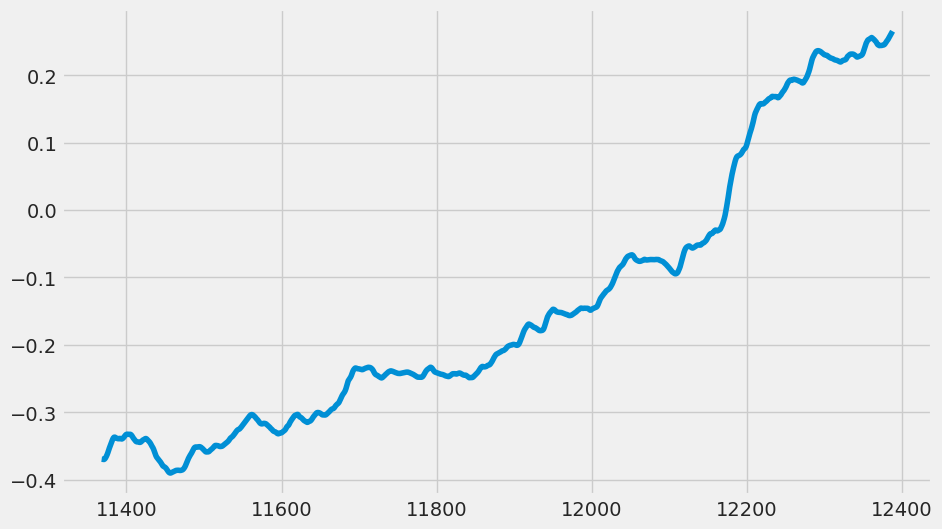

In [ ]:
# The original non-stationary plot
result.trend.plot()



<Axes: >

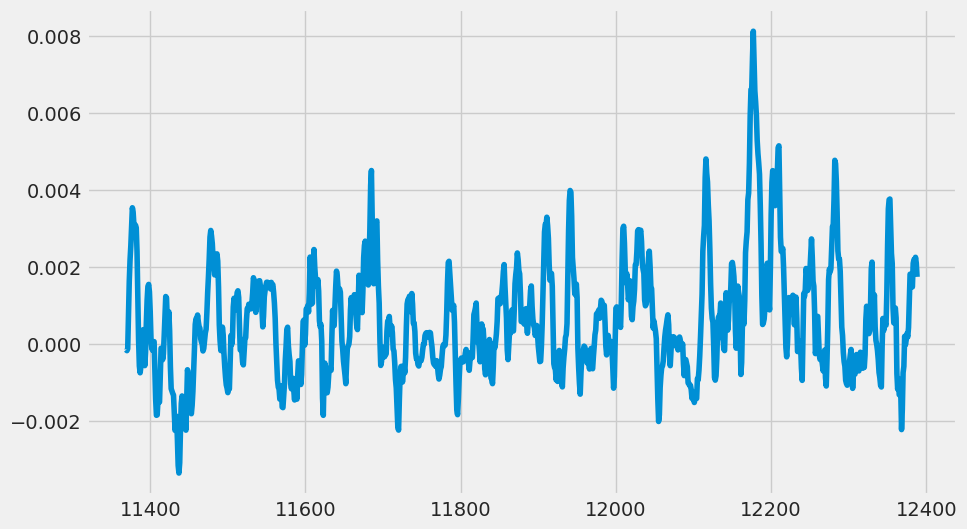

In [ ]:
result.trend.diff().plot()

In [ ]:
differenced_series = data_preparation['Close'].diff().dropna()

In [ ]:
differenced_series

6197    -0.316496
8263    -0.564918
5164     0.611106
9296    -0.748649
4131    -0.227834
           ...   
10328    0.205057
3097     0.547825
8262    -0.196521
12394    0.689580
13427   -0.430742
Name: Close, Length: 13427, dtype: float64

In [ ]:
# Iterate over each unique value in the 'Ind_Name_Encoded' column
for ind_encoded in data_preparation['Ind_Name_Encoded'].unique():
    # Subset the data for the current 'Ind_Name_Encoded'
    subset_data = data_preparation[data_preparation['Ind_Name_Encoded'] == ind_encoded]

    # Apply differencing
    subset_data['Close_diff'] = subset_data['Close'].diff()

    # Drop rows with missing or infinite values
    subset_data.dropna(subset=['Close_diff'], inplace=True)

    # Perform the Augmented Dickey-Fuller test after differencing
    adf_result_diff = adfuller(subset_data['Close_diff'])

    # Print the p-value after differencing
    print("p-value after differencing for Ind_Name_Encoded {}: {}".format(ind_encoded, adf_result_diff[1]))


p-value after differencing for Ind_Name_Encoded 1: 0.0
p-value after differencing for Ind_Name_Encoded 9: 0.0
p-value after differencing for Ind_Name_Encoded 10: 0.0
p-value after differencing for Ind_Name_Encoded 6: 0.0
p-value after differencing for Ind_Name_Encoded 11: 2.904295907413688e-17
p-value after differencing for Ind_Name_Encoded 5: 0.0
p-value after differencing for Ind_Name_Encoded 12: 0.0
p-value after differencing for Ind_Name_Encoded 4: 2.5345866163511696e-11
p-value after differencing for Ind_Name_Encoded 13: 3.4895116395012074e-08
p-value after differencing for Ind_Name_Encoded 3: 2.5798248733261533e-30
p-value after differencing for Ind_Name_Encoded 2: 1.1561722857582823e-20
p-value after differencing for Ind_Name_Encoded 8: 2.8208943409545064e-30
p-value after differencing for Ind_Name_Encoded 7: 0.0


P_Value <0.05 So we Reject Null Hypothesis: Time series is stationary

### **ARIMA**

In [ ]:
data_preparation=data_preparation[["Close"]].copy()

In [ ]:
data_preparation.describe()

,Close
count,13428.000000
mean,-0.279159
std,0.472465
min,-1.000000
25%,-0.642563
50%,-0.423227
75%,0.035908
max,1.000000


An ARIMA method is characterized by 3 terms (p,d,q):


*   p is the order of the ar term
*   d is the number of differencing required to make the time series stationary
*   q is the order of the MA term

As we see in the parameters required by thr model , any stationary time series can be modeled with ARIMA models



**ACF for close to compare stationarity**

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf

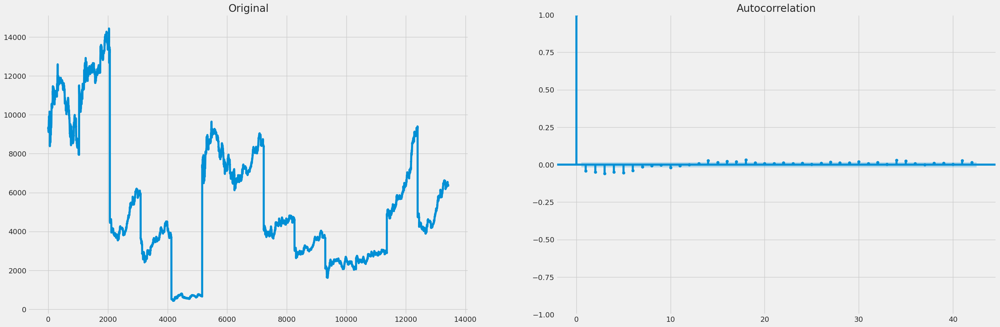

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
ax1.plot(data_copy['Close'])
ax1.set_title("Original")
plot_acf(data_preparation['Close'], ax=ax2)
plt.show()


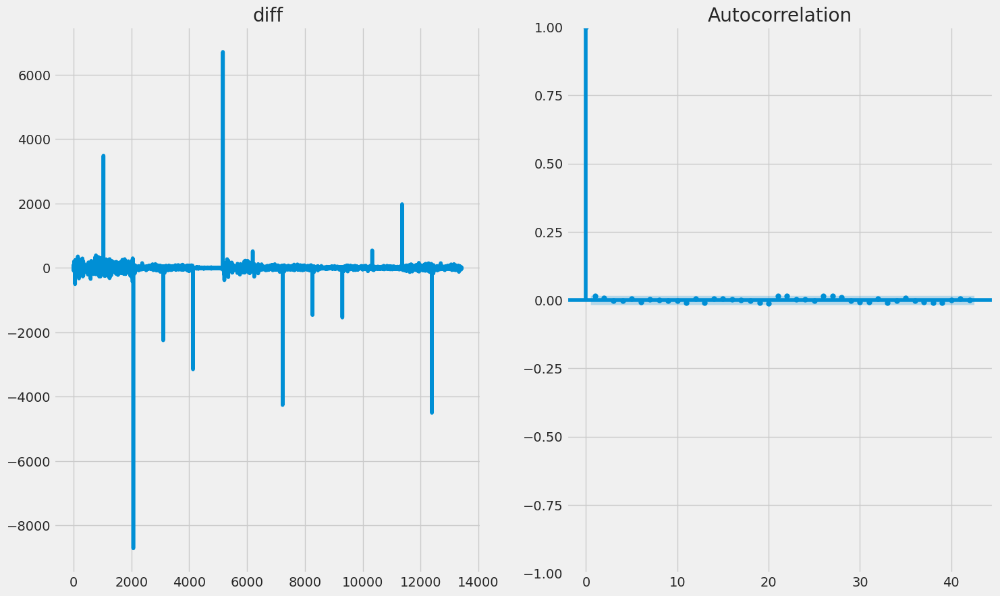

In [ ]:
diff=data_copy.Close.diff().dropna()
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 10))
ax1.plot(diff)
ax1.set_title("diff")
plot_acf(diff, ax=ax2)
plt.show()

we can use the pmdarima package to get the number of differencing

**d**

In [ ]:
pip install pmdarima


In [ ]:
from pmdarima.arima.utils import ndiffs


In [ ]:
ndiffs(data_copy.Close , test="adf")

1

**P**

p is the order of the Auto Regressive (AR) term . it refers to the number of lags to be used as predictors.
we can find out the required number of AR terms by inspecting the Partial Autocorrelation (PACF) plot.
the partial autocorrelation represents the correlation between the series and lags .

In [ ]:
from statsmodels.graphics.tsaplots import plot_pacf

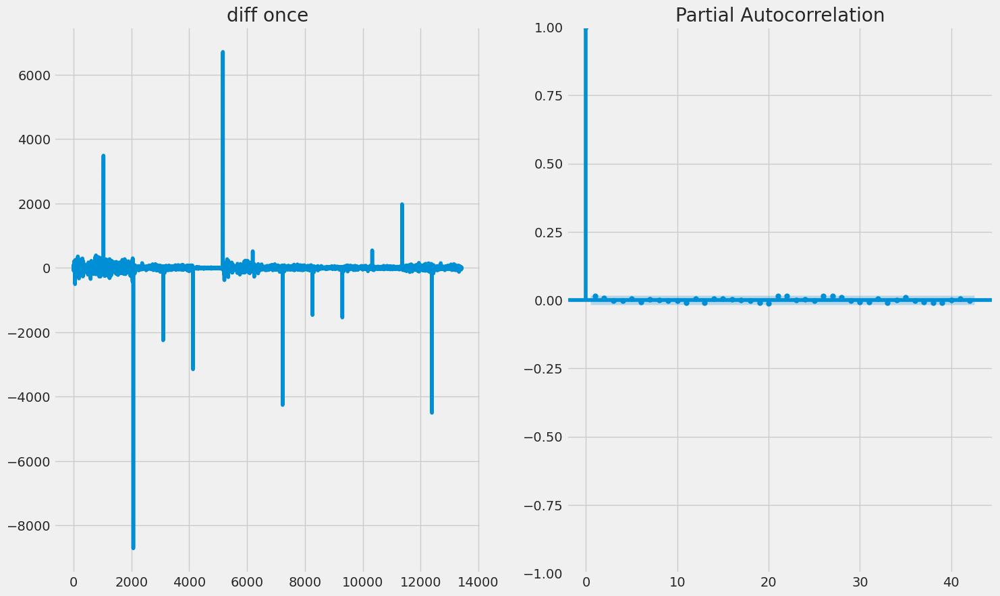

In [ ]:
diff=data_copy.Close.diff().dropna()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 10))

ax1.plot(diff)
ax1.set_title("diff once")
ax2.set_ylim(0,1)
plot_pacf(diff, ax=ax2);



We can Observe that the PACF lag 11 because it's above the significance line

**q**

q is the order of the Moving A verage (MA) term. it refers to the number of lagged forecast errors of lagged forecast errors that shoul go into ARIMA Model.

We can look at the ACF plot for the number of MA terms


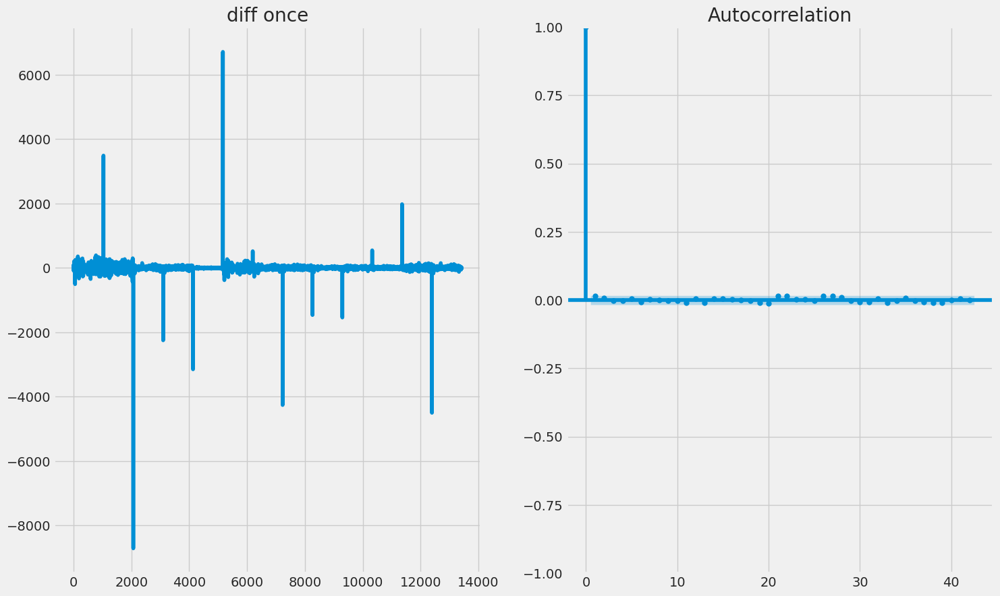

In [ ]:
diff=data_copy.Close.diff().dropna()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 10))

ax1.plot(diff)
ax1.set_title("diff once")
ax2.set_ylim(0,1)
plot_acf(diff, ax=ax2);

6

**Fitting the ARIMA model**

In [ ]:
from statsmodels.tsa.arima.model import ARIMA

model= ARIMA(data_copy.Close, order=(11, 1, 6))
result=model.fit()



In [ ]:
print(result.summary())

                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                13428
Model:                ARIMA(11, 1, 6)   Log Likelihood              -84227.581
Date:                Mon, 29 Apr 2024   AIC                         168491.162
Time:                        15:00:30   BIC                         168626.252
Sample:                             0   HQIC                        168536.227
                              - 13428                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0078      3.521      0.002      0.998      -6.894       6.910
ar.L2          0.0041      1.827      0.002      0.998      -3.576       3.585
ar.L3         -0.0010      2.542     -0.000      1.0

In [ ]:
from statsmodels.tsa.arima.model import ARIMA

model= ARIMA(data_preparation.Close, order=(15, 1, 15))
result1=model.fit()

In [ ]:
print(result1.summary())

                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                13428
Model:               ARIMA(15, 1, 15)   Log Likelihood               -8364.295
Date:                Mon, 29 Apr 2024   AIC                          16790.589
Time:                        15:03:37   BIC                          17023.245
Sample:                             0   HQIC                         16868.202
                              - 13428                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.9304      0.454     -4.255      0.000      -2.820      -1.041
ar.L2         -2.2633      0.709     -3.192      0.001      -3.653      -0.874
ar.L3         -1.7728      0.649     -2.732      0.0

(array([0.01968159, 0.21957272, 0.63965163, 1.0901755 , 0.76665939,
        0.54831676, 0.33458701, 0.24663491, 0.22510817, 0.03905565]),
 array([-1.08164091, -0.83947752, -0.59731413, -0.35515074, -0.11298735,
         0.12917604,  0.37133943,  0.61350282,  0.85566621,  1.0978296 ,
         1.33999299]),
 <BarContainer object of 10 artists>)

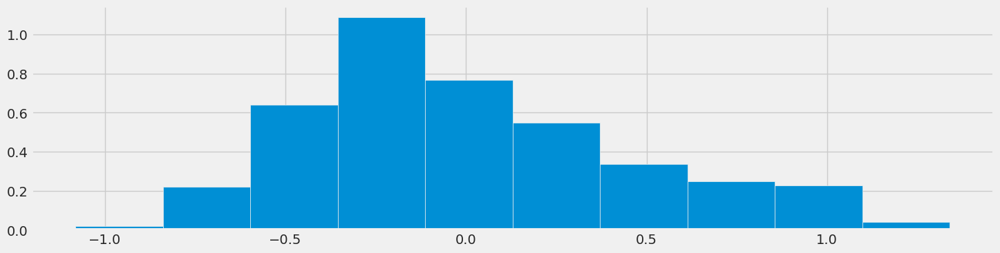

In [ ]:
residuals = pd.DataFrame(result1.resid)

# Corrected figsize syntax
fig, ( ax2) = plt.subplots( figsize=(16, 4))
ax2.hist(residuals, density=True)


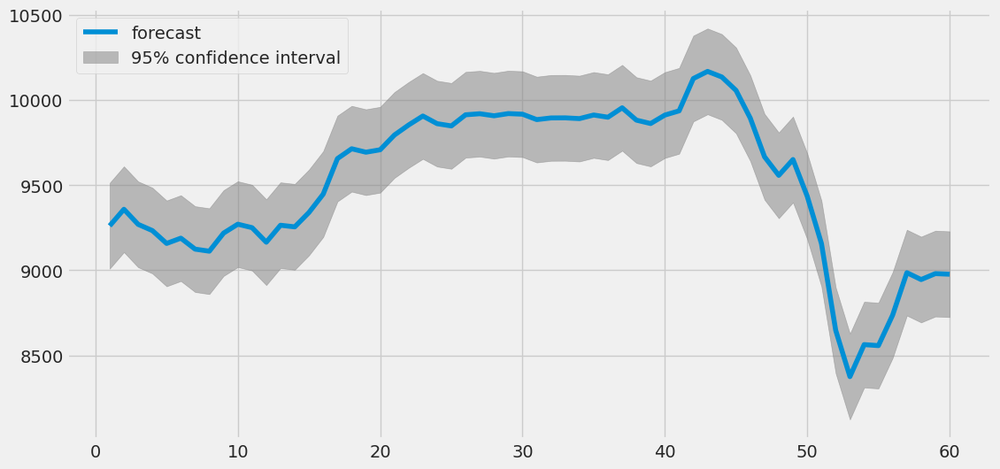

In [ ]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_predict

# Plot the predicted values
fig, ax = plt.subplots(figsize=(12, 6))
plot_predict(result, start=1, end=60, dynamic=False, ax=ax)
plt.show()


MSE (Mean Squared Error)

In [ ]:
from sklearn.metrics import mean_squared_error

# Make predictions on the same data used for training (in-sample predictions)
predictions = result.predict(typ='levels')

# Calculate mean squared error
n = len(data_copy.Close) - len(predictions) - 1  # Determine the number of initial values ignored in predictions
mse = mean_squared_error(data_copy.Close[n+1:], predictions)  # Exclude the first n+1 values as they were not predicted
print("Mean Squared Error:", mse)


Mean Squared Error: 22833.63237574368


Now we will split the data into train and test

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Assume you have the data in a DataFrame called `data_copy`

# Initialize empty lists to hold the training and testing subsets
train_sets = []
test_sets = []

# Group data by 'Ind_Name' column
grouped_data = data_copy.groupby('Ind_Name')

# Iterate through each group
for name, group in grouped_data:
    # Split the group into 80% train and 20% test using train_test_split
    train_data, test_data = train_test_split(group, test_size=0.2, random_state=42)

    # Append the train and test data to the respective lists
    train_sets.append(train_data)
    test_sets.append(test_data)

# Concatenate all train sets and test sets
train_set = pd.concat(train_sets)
test_set = pd.concat(test_sets)

# Now you have `train_set` and `test_set` as the 80% train and 20% test datasets


In [ ]:
n=int(len(data_copy)* 0.8)
train=data_copy.Close[:n]
test=data_copy.Close[n:]

In [ ]:
print(len(train_set))
print(len(test_set))

10737
2691


In [ ]:
model=ARIMA(train, order=(11,1,6))
result=model.fit()

In [ ]:
from sklearn.metrics import r2_score, mean_squared_error
import math

# Assuming you have already calculated predictions using result.predict(typ='levels')
predictions_Arima = result1.predict(typ='levels')

# Calculate mean squared error
n = len(data_preparation.Close) - len(predictions_Arima) - 1  # Determine the number of initial values ignored in predictions

r2 = r2_score(data_preparation.Close[n+1:], predictions_Arima)
print("R^2 Score:", r2)

mse = mean_squared_error(data_preparation.Close[n+1:], predictions_Arima)
print("Mean Squared Error:", mse)

rmse = math.sqrt(mse)
print("The root mean squared error is {}.".format(rmse))


R^2 Score: 0.0883176504857387
Mean Squared Error: 0.2034937802843712
The root mean squared error is 0.45110284889853136.


In [ ]:
mape = mean_absolute_percentage_error(data_copy.Close[n+1:], predictions_Arima)
print("Mean Absolute Percentage Error:", mape)

Mean Absolute Percentage Error: 224.89480196260234


theoreticaly we can find an optimal ARIMA model to fit this better
Price

Data cannot be fitted properly with just a simple linear model in most of the cases

And In the real world the markets are much too complicated to be fitted with simple linear models

### SARIMA

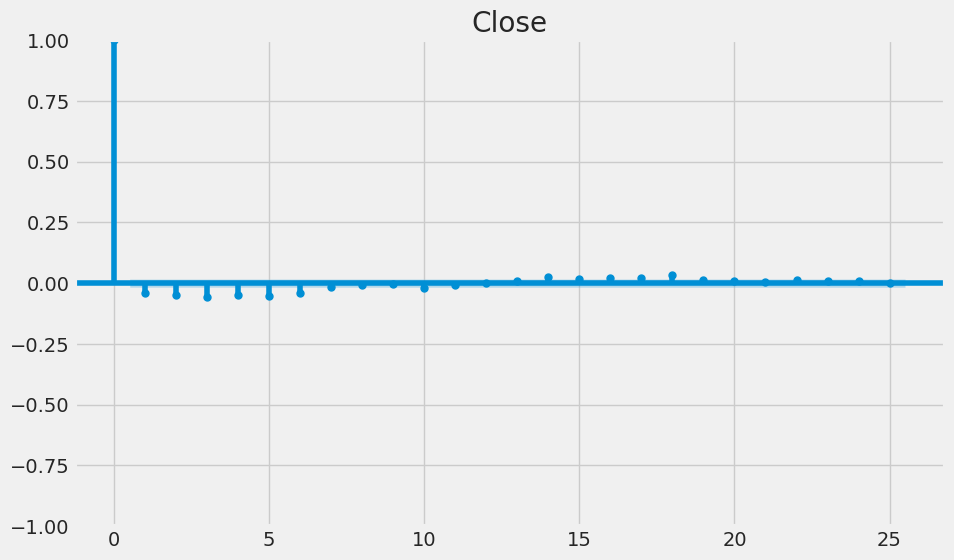

In [ ]:
plot_acf(data_preparation["Close"],lags=25,title="Close")
plt.show()

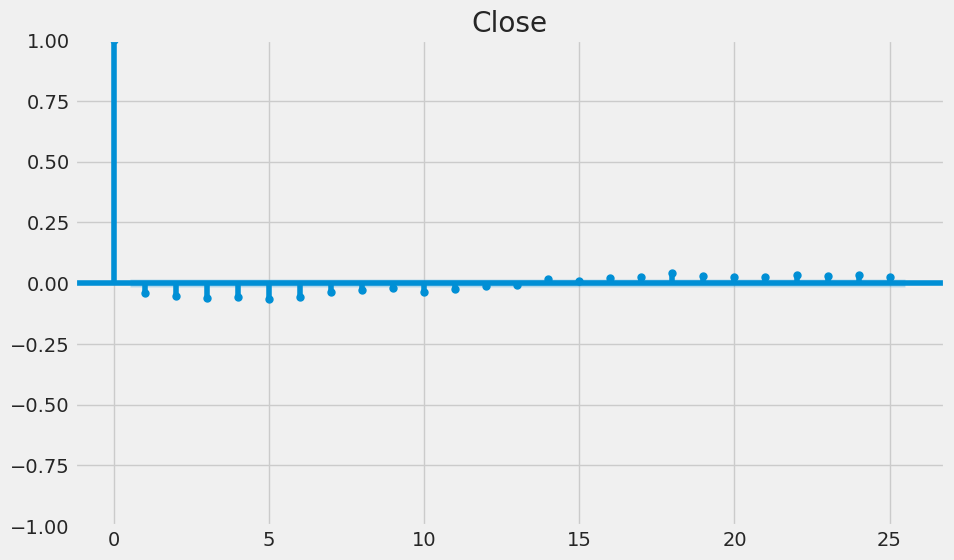

In [ ]:
plot_pacf(data_preparation["Close"],lags=25,title="Close")
plt.show()

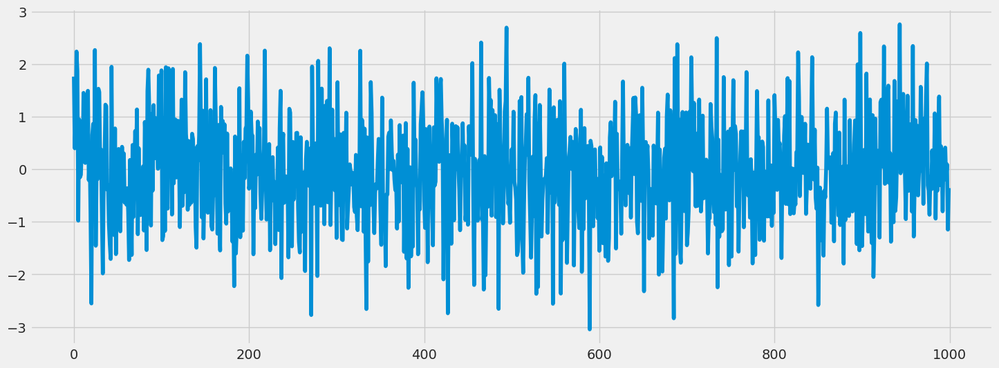

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Plotting white noise
np.random.seed(0)  # Set seed for reproducibility
rcParams['figure.figsize'] = 16, 6

white_noise = np.random.normal(loc=0, scale=1, size=1000)
# loc is mean, scale is standard deviation
plt.plot(white_noise)
plt.show()


We will explain this model by building up letter by letter.  SARIMA(p,d,q)(P,D,Q,s)
 , Seasonal Autoregression Moving Average model:

AR(p)
  - autoregression model i.e. regression of the time series onto itself. The basic assumption is that the current series values depend on its previous values with some lag (or several lags). The maximum lag in the model is referred to as  p
 . To determine the initial  p
 , you need to look at the PACF plot and find the biggest significant lag after which most other lags become insignificant.
MA(q)
  - moving average model. Without going into too much detail, this models the error of the time series, again with the assumption that the current error depends on the previous with some lag, which is referred to as  q
 . The initial value can be found on the ACF plot with the same logic as before.
Let's combine our first 4 letters:

AR(p)+MA(q)=ARMA(p,q)

What we have here is the Autoregressive–moving-average model! If the series is stationary, it can be approximated with these 4 letters. Let's continue.

I(d)
  - order of integration. This is simply the number of nonseasonal differences needed to make the series stationary. In our case, it's just 1 because we used first differences.
Adding this letter to the four gives us the  ARIMA
  model which can handle non-stationary data with the help of nonseasonal differences. Great, one more letter to go!

S(s)
  - this is responsible for seasonality and equals the season period length of the series
With this, we have three parameters:  (P,D,Q)

P
  - order of autoregression for the seasonal component of the model, which can be derived from PACF. But you need to look at the number of significant lags, which are the multiples of the season period length. For example, if the period equals 24 and we see the 24-th and 48-th lags are significant in the PACF, that means the initial  P
  should be 2.

Q
  - similar logic using the ACF plot instead.

D
  - order of seasonal integration. This can be equal to 1 or 0, depending on whether seasonal differeces were applied or not.

In [ ]:
from pmdarima.arima import auto_arima
arima_m = auto_arima(data_preparation['Close'],trace=True ,suppress_warnings=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=50.76 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=27829.843, Time=1.49 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=24038.859, Time=0.96 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=21.01 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=27827.843, Time=0.50 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=22530.749, Time=3.02 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=21640.273, Time=2.39 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=21108.844, Time=5.00 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=20688.150, Time=7.96 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=59.11 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=53.07 sec
 ARIMA(5,1,0)(0,0,0)[0]             : AIC=20686.150, Time=2.59 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=21106.844, Time=1.05 sec
 ARIMA(5,1,1)(0,0,0)[0]             : AIC=inf, Time=9.90 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=inf

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                13427
Model:               SARIMAX(5, 1, 0)   Log Likelihood              -13013.211
Date:                Mon, 29 Apr 2024   AIC                          26040.422
Time:                        15:15:45   BIC                          26092.957
Sample:                             0   HQIC                         26057.947
                              - 13427                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0001      0.006      0.021      0.983      -0.011       0.011
ar.L1         -1.4121      0.009   -159.746      0.000      -1.429      -1.395
ar.L2         -1.3989      0.014    -97.597      0.0

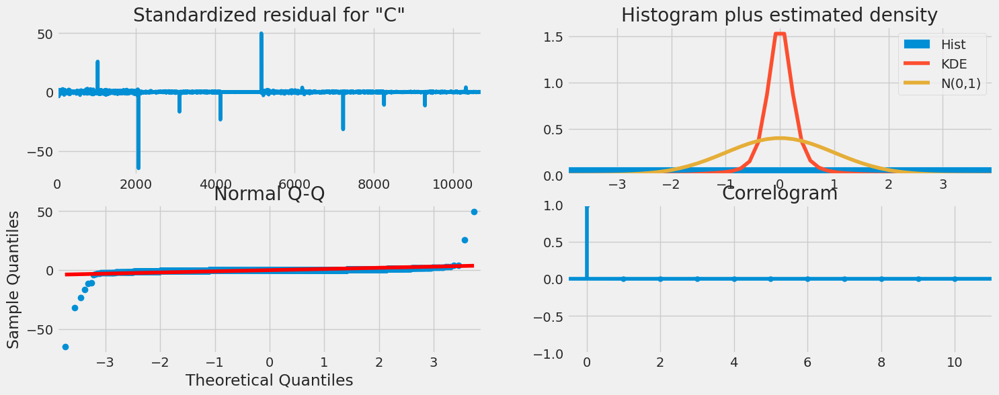

In [ ]:

train_sample = data_preparation["Close"].diff().iloc[1:].values
model = sm.tsa.SARIMAX(train_sample,order=(5,1,0),trend='c')
result_Sarima= model.fit(maxiter=1000,disp=False)
print(result_Sarima.summary())
predicted_result = result_Sarima.predict(start=0, end=500)
result.plot_diagnostics()
# calculating error
rmse = math.sqrt(mean_squared_error(train_sample[1:502], predicted_result))
print("The root mean squared error is {}.".format(rmse))

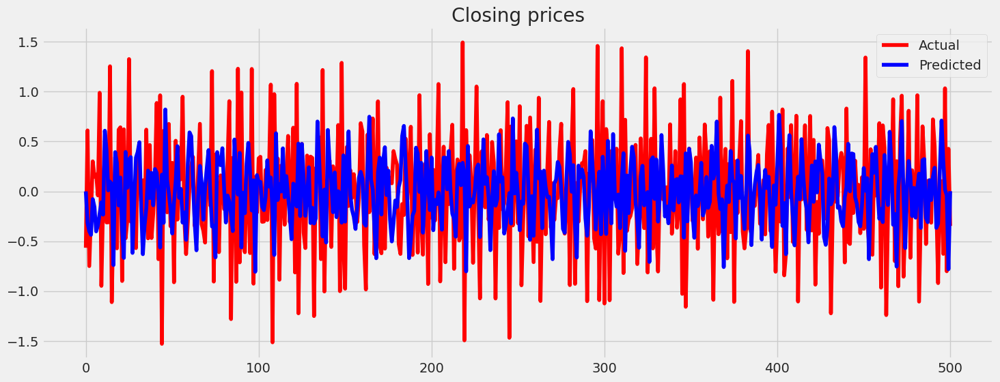

In [ ]:
plt.plot(train_sample[1:502],color='red')
plt.plot(predicted_result,color='blue')
plt.legend(['Actual','Predicted'])
plt.title('Closing prices')
plt.show()

In [ ]:
from sklearn.metrics import r2_score, mean_squared_error


r2 = r2_score(train_sample[1:502], predicted_result)
print("R^2 Score:", r2)
print(f'mean_squared_error = {mean_squared_error(train_sample[1:502], predicted_result)}')
rmse = math.sqrt(mean_squared_error(train_sample[1:502], predicted_result))
print("The root mean squared error is {}.".format(rmse))



R^2 Score: -0.2991972438630641
mean_squared_error = 0.4437135077215726
The root mean squared error is 0.6661182385444588.


In [ ]:
mape = mean_absolute_percentage_error(train_sample[1:502], predicted_result)
print("Mean Absolute Percentage Error:", mape)

Mean Absolute Percentage Error: 413.9494818126707


### SARIMAX

In [ ]:
import plotly.graph_objects as go

test_size  = 0.2


test_split_idx  = int(data_copy.shape[0] * (1-test_size))


train_sarimax  = data_copy.loc[:test_split_idx].copy()

test_sarimax   = data_copy.loc[test_split_idx+1:].copy()

In [ ]:
print(len(train))

10742


In [ ]:
train_sarimax = train_sarimax['Close']
test_sarimax = test_sarimax['Close']

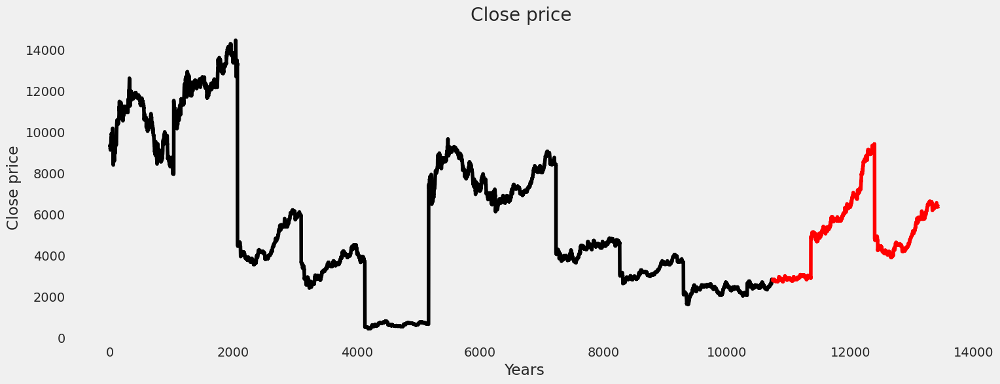

In [ ]:
plt.plot(train_sarimax, color = "black")
plt.plot(test_sarimax, color = "red")

# title and axis captions
plt.title("Close price ")
plt.ylabel("Close price ")
plt.xlabel('Years')

# add a grid
plt.grid()

plt.show()

In [ ]:
# forcibly disable system warnings
import warnings
warnings.simplefilter(action = 'ignore', category = Warning)

# let's train the model with the appropriate parameters, SARIMAX(0, 1, 0)x(0, 1, 0, 12)
# importing the model class
from statsmodels.tsa.statespace.sarimax import SARIMAX

# let's create an object of this model
model = SARIMAX(train_sarimax,
                order = (0,1,0),
                seasonal_order = (0, 1, 0, 12),
                enforce_stationarity = False,
                enforce_invertibility = False)

# apply the method fit
result_sarimax = model.fit(maxiter = 500, method = 'nm')

Optimization terminated successfully.
         Current function value: 6.657401
         Iterations: 18
         Function evaluations: 36


In [ ]:
result_sarimax.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              Close   No. Observations:                10743
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood              -71520.458
Date:                            Mon, 29 Apr 2024   AIC                         143042.916
Time:                                    15:20:23   BIC                         143050.197
Sample:                                         0   HQIC                        143045.372
                                          - 10743                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      3.611e+04     20.346   1774.760      0.000    3.61e+04    3.61e+04
===================================================================================
Ljung-Box (L1) (Q):                   7.29   Jarque-Bera (JB):         614366438.15
Prob(Q):                              0.01   Prob(JB):                         0.00
Heteroskedasticity (H):               0.23   Skew:                             0.53
Prob(H) (two-sided):                  0.00   Kurtosis:                      1175.30
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

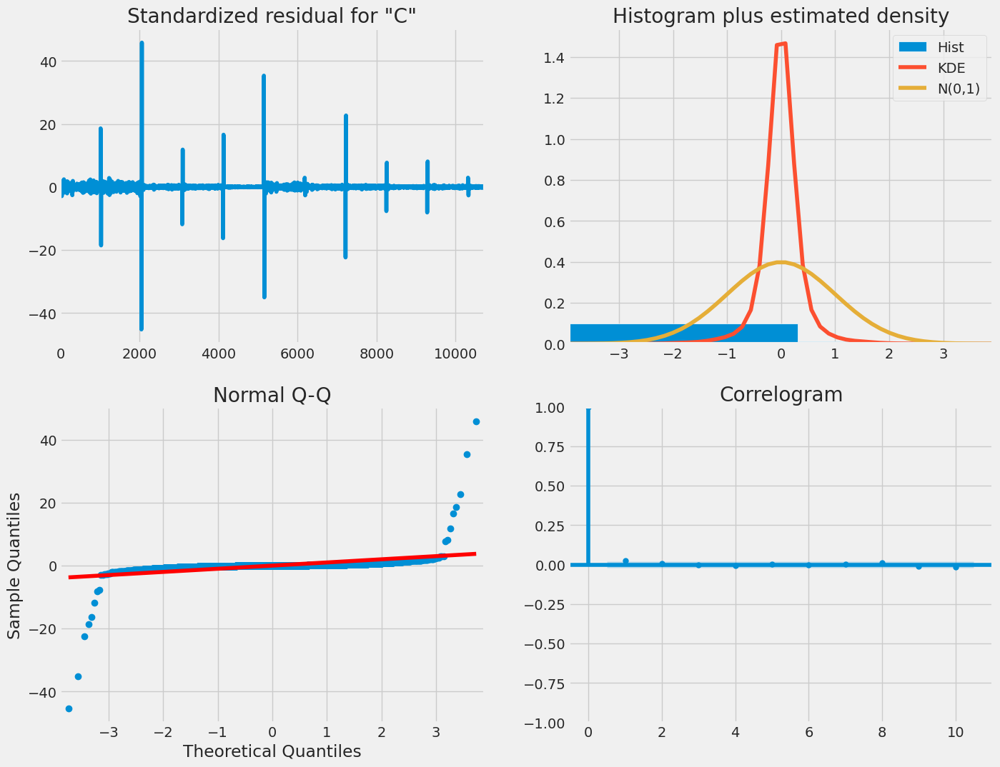

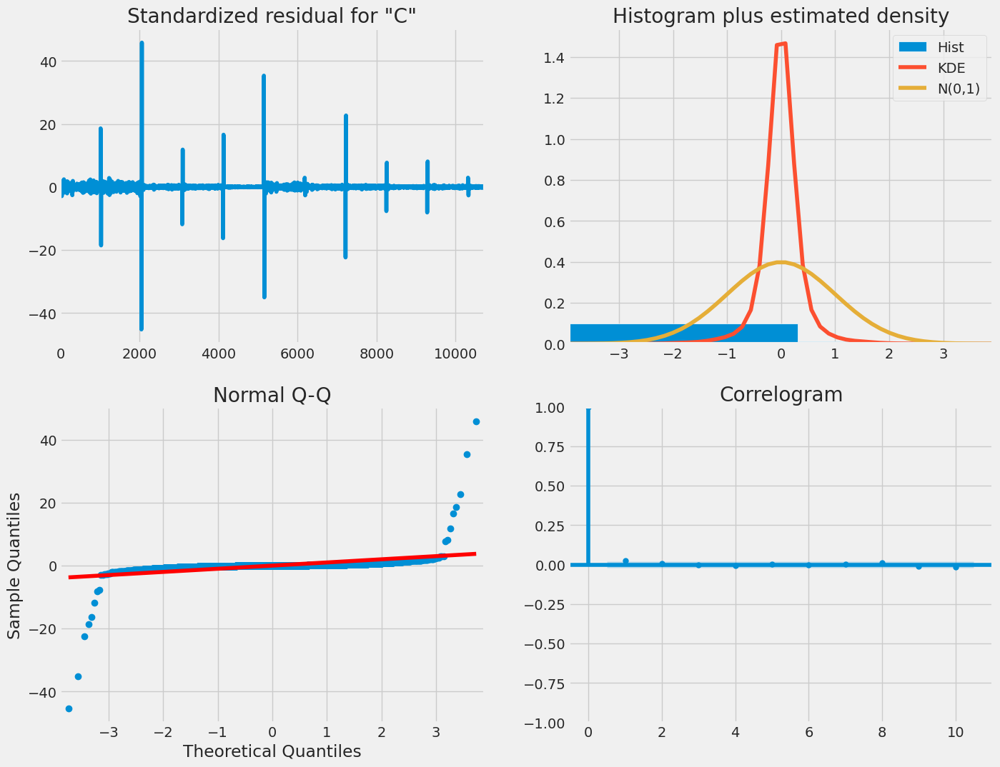

In [ ]:
result_sarimax.plot_diagnostics(figsize=(15, 12))

In [ ]:
# the test forecast period will start from the end of the training period
start = len(train_sarimax)

# and it will end at the end of the test
end = len(train_sarimax) + len(test_sarimax) - 1

# apply the method predict
predictions = result_sarimax.predict(start, end)
predictions

10743     2885.546
10744     2894.292
10745     2881.949
10746     2860.560
10747     2835.631
           ...    
13423    14684.959
13424    14690.141
13425    14704.283
13426    14687.006
13427    14703.368
Name: predicted_mean, Length: 2685, dtype: float64

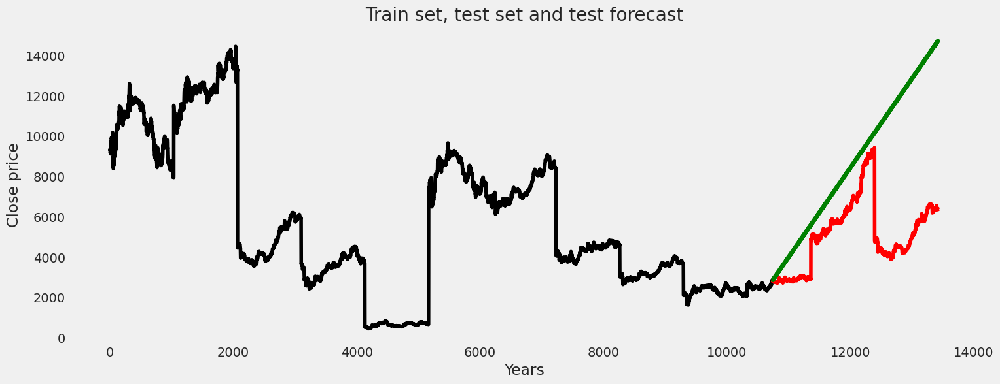

In [ ]:
# we will output three curves (training, test set and test forecast)
plt.plot(train_sarimax, color = "black")
plt.plot(test_sarimax, color = "red")
plt.plot(predictions, color = "green")

# title and axis captions
plt.title("Train set, test set and test forecast")
plt.ylabel("Close price")
plt.xlabel('Years')

# add a grid
plt.grid()

plt.show()

In [ ]:
# importing a metric
from sklearn.metrics import mean_squared_error

# calculate MSE
print('MSE = ', mean_squared_error(test_sarimax, predictions))

# and RMSE
print('RMSE = ', np.sqrt(mean_squared_error(test_sarimax, predictions)))

r2 = r2_score(test_sarimax, predictions)
print("R^2 Score:", r2)

MSE =  22645327.304644983
RMSE =  4758.710676711181
R^2 Score: -6.888517315897481


In [ ]:
mape = mean_absolute_percentage_error(test_sarimax, predictions)
print("Mean Absolute Percentage Error:", mape)

Mean Absolute Percentage Error: 77.26668776271825


## LSTM

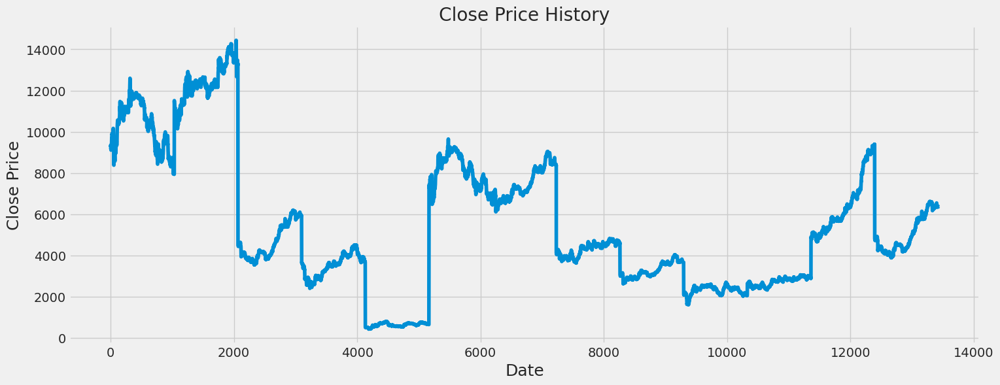

In [ ]:
plt.figure(figsize=(16,6))
plt.title('Close Price History')
plt.plot(data_copy['Close'])
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price', fontsize=18)
plt.show()

In [ ]:


# Chargez vos données de série temporelle dans le DataFrame combined_indexes
# Assurez-vous que vos données ont une colonne 'Date' et des colonnes pour les prix (High, Low, Close, Open)
# combined_indexes = pd.read_csv('votre_fichier.csv')

# Etape 1: Exploration des données (EDA)
# Visualiser les tendances des prix (High, Low, Close, Open) pour chaque valeur unique de 'Ind_Name'
for index_name in combined_indexes['Ind_Name'].unique():
    # Filtrer les données pour le 'Ind_Name' actuel
    data_subset = combined_indexes[combined_indexes['Ind_Name'] == index_name]

    # Créer une figure pour chaque 'Ind_Name'
    fig = go.Figure()

    # Ajouter des traces pour les prix High, Low, Close et Open

    fig.add_trace(go.Scatter(x=data_subset['Date'], y=data_subset['Close'], mode='lines', name='Close'))

    # Mettre à jour la disposition de la figure
    fig.update_layout(title=f"Price Trends for {index_name}",
                      xaxis_title='Date',
                      yaxis_title='Price')

    # Afficher le graphique
    fig.show()



In [ ]:
import numpy as np

# Create a new dataframe with only the 'Close' column
data = data_copy.filter(['Close'])

# Convert the dataframe to a numpy array
dataset = data.values

# Get the number of rows to train the model on (80% of the data)
training_data_len = int(np.ceil(len(dataset) * 0.8))

# The remaining data will be used for testing (20%)
test_data_len = len(dataset) - training_data_len

print("Training data length:", training_data_len)
print("Test data length:", test_data_len)


Training data length: 10743
Test data length: 2685


In [ ]:
# Scale the data
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0,1))
scaled_data = scaler.fit_transform(dataset)

scaled_data

array([[0.63027845],
       [0.63717958],
       [0.63111774],
       ...,
       [0.42356065],
       [0.42290573],
       [0.42349025]])

In [ ]:
# Create the training data set
# Create the scaled training data set
train_data = scaled_data[0:int(training_data_len), :]
# Split the data into x_train and y_train data sets
x_train = []
y_train = []

for i in range(60, len(train_data)):
    x_train.append(train_data[i-60:i, 0])
    y_train.append(train_data[i, 0])
    if i<= 61:
        print(x_train)
        print(y_train)
        print()

# Convert the x_train and y_train to numpy arrays
x_train, y_train = np.array(x_train), np.array(y_train)

# Reshape the data
x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))
# x_train.shape

[array([0.63027845, 0.63717958, 0.63111774, 0.62857359, 0.62311113,
       0.62530126, 0.62078448, 0.61979195, 0.62730951, 0.63098208,
       0.62985095, 0.62372978, 0.63050488, 0.6299557 , 0.63591721,
       0.64359322, 0.65819592, 0.66265501, 0.66135544, 0.66236275,
       0.66832261, 0.67258983, 0.67644897, 0.6732564 , 0.67241646,
       0.67703007, 0.67749434, 0.67662913, 0.67742229, 0.6771943 ,
       0.67508557, 0.67568537, 0.67566459, 0.6753327 , 0.67684748,
       0.67596149, 0.67983406, 0.67475425, 0.6733433 , 0.67679414,
       0.67847173, 0.69197608, 0.6949488 , 0.69280216, 0.68734841,
       0.67569016, 0.65979182, 0.65173444, 0.6580916 , 0.64303048,
       0.62347001, 0.58746695, 0.5677329 , 0.58061653, 0.57991205,
       0.59272613, 0.61017359, 0.60762308, 0.61064815, 0.60985441])]
[0.6117356407918729]

[array([0.63027845, 0.63717958, 0.63111774, 0.62857359, 0.62311113,
       0.62530126, 0.62078448, 0.61979195, 0.62730951, 0.63098208,
       0.62985095, 0.62372978, 0.630

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM

# Build the LSTM model
model = Sequential()
model.add(LSTM(128, return_sequences=True, input_shape= (x_train.shape[1], 1)))
model.add(LSTM(64, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(x_train, y_train, batch_size=1, epochs=1)

10683/10683 [==============================] - 604s 56ms/step - loss: 7.0479e-04


In [ ]:
# Create the testing data set
# Create a new array containing scaled values from index 1543 to 2002
test_data = scaled_data[training_data_len - 60: , :]
# Create the data sets x_test and y_test
x_test = []
y_test = dataset[training_data_len:, :]
for i in range(60, len(test_data)):
    x_test.append(test_data[i-60:i, 0])

# Convert the data to a numpy array
x_test = np.array(x_test)

# Reshape the data
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1 ))

# Get the models predicted price values
predictions = model.predict(x_test)
predictions = scaler.inverse_transform(predictions)

# Get the root mean squared error (RMSE)
rmse = np.sqrt(np.mean(((predictions - y_test) ** 2)))
rmse

84/84 [==============================] - 7s 88ms/step


115.90890503117181

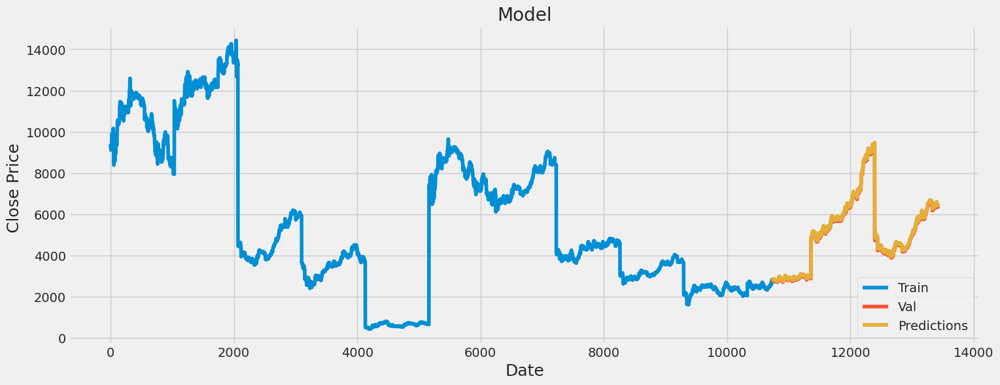

In [ ]:
# Plot the data
train = data[:training_data_len]
valid = data[training_data_len:]
valid['Predictions'] = predictions
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price ', fontsize=18)
plt.plot(train['Close'])
plt.plot(valid[['Close', 'Predictions']])
plt.legend(['Train', 'Val', 'Predictions'], loc='lower right')
plt.show()

In [ ]:
import plotly.graph_objects as go

# Create traces
trace_train = go.Scatter(x=train.index, y=train['Close'], mode='lines', name='Train')
trace_valid = go.Scatter(x=valid.index, y=valid['Close'], mode='lines', name='Val')
trace_predictions = go.Scatter(x=valid.index, y=valid['Predictions'], mode='lines', name='Predictions')

# Combine traces
data = [trace_train, trace_valid, trace_predictions]

# Layout
layout = go.Layout(
    title='Model',
    xaxis=dict(title='Date', tickformat='%Y-%m-%d'),
    yaxis=dict(title='Close Price')
)

# Plot
fig = go.Figure(data=data, layout=layout)
fig.show()


In [ ]:
from sklearn.metrics import r2_score, mean_squared_error


r2 = r2_score(y_test, predictions)
print("R^2 Score:", r2)
print(f'mean_squared_error = {mean_squared_error(y_test, predictions)}')
rmse = math.sqrt(mean_squared_error(y_test, predictions))
print("The root mean squared error is {}.".format(rmse))



R^2 Score: 0.9953199511380539
mean_squared_error = 13434.874265525206
The root mean squared error is 115.90890503117181.


7/7 [==============================] - 1s 33ms/step


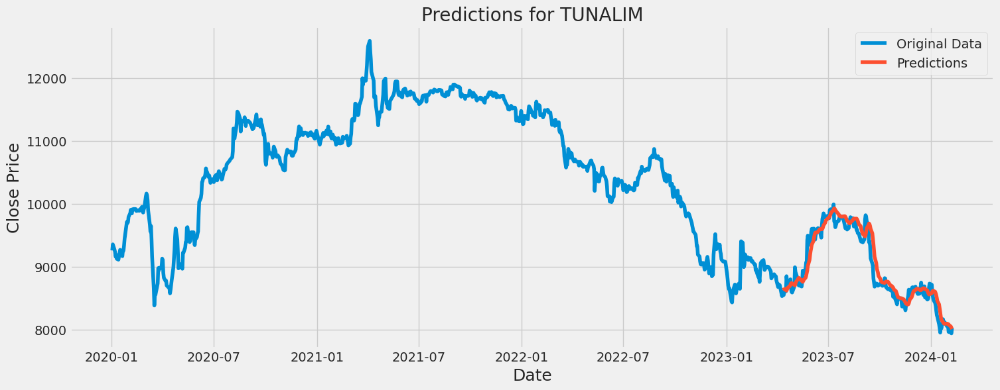

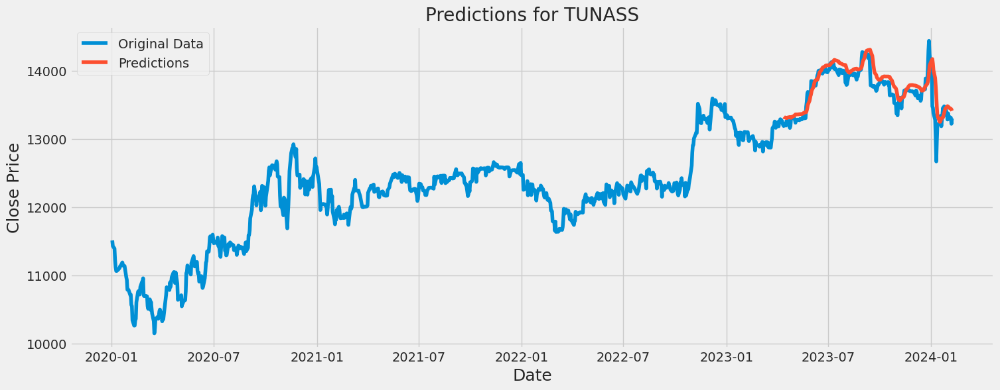

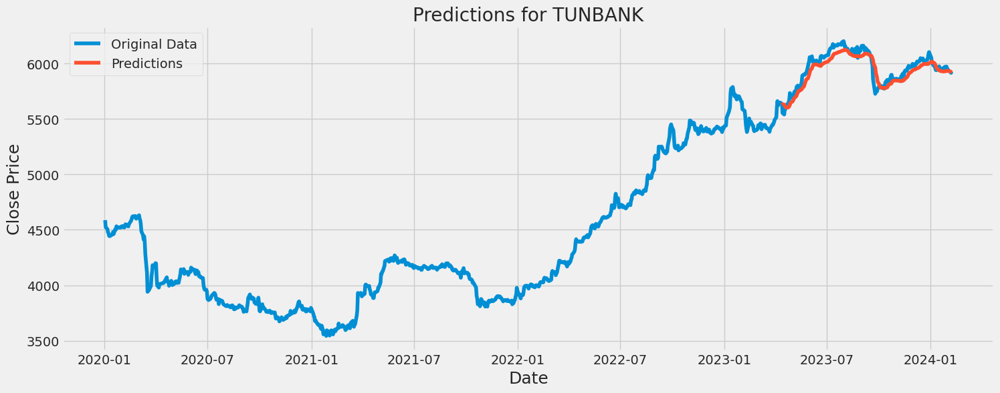

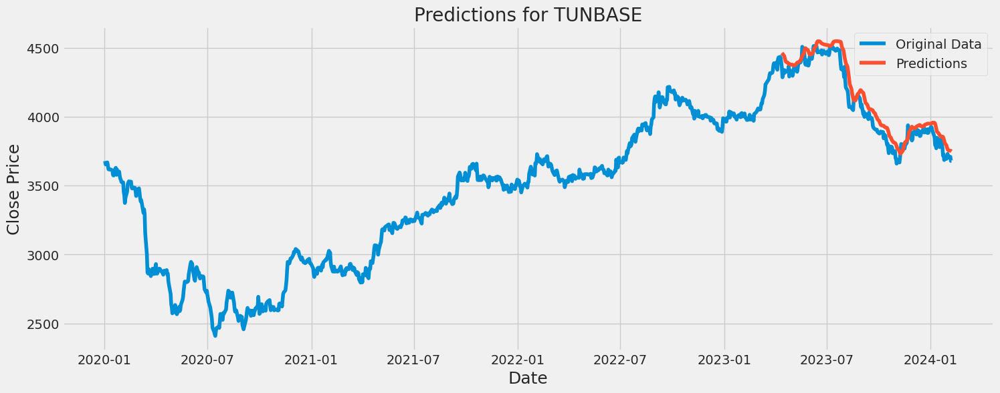

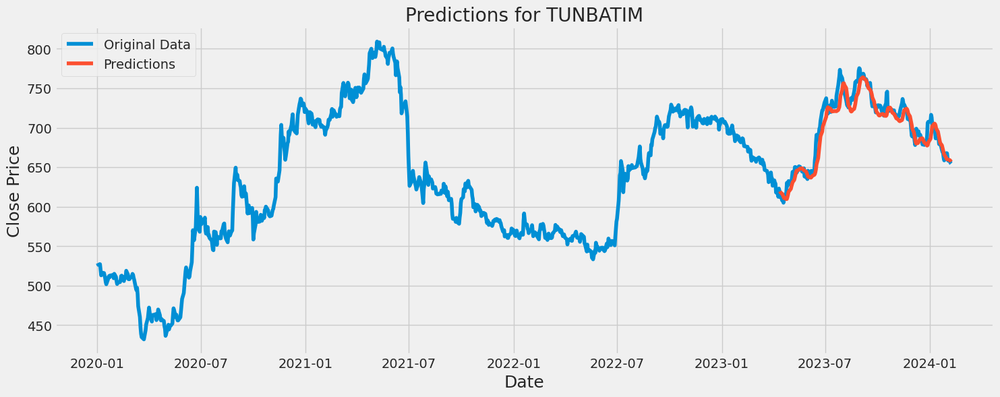

...

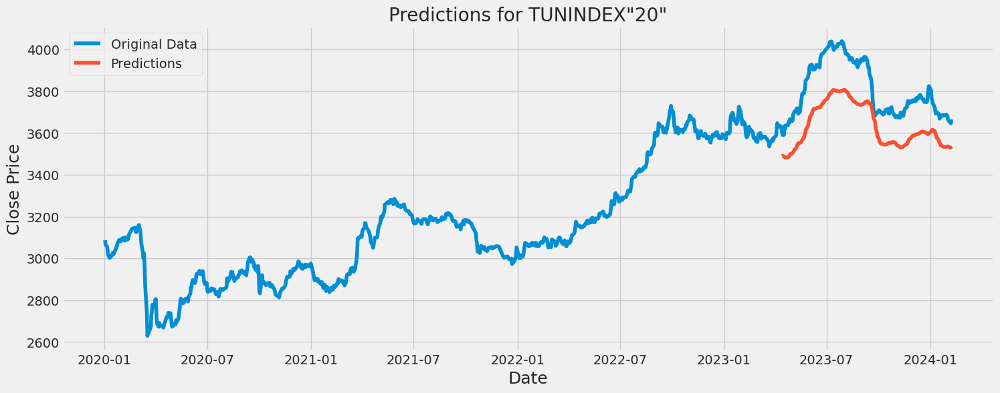

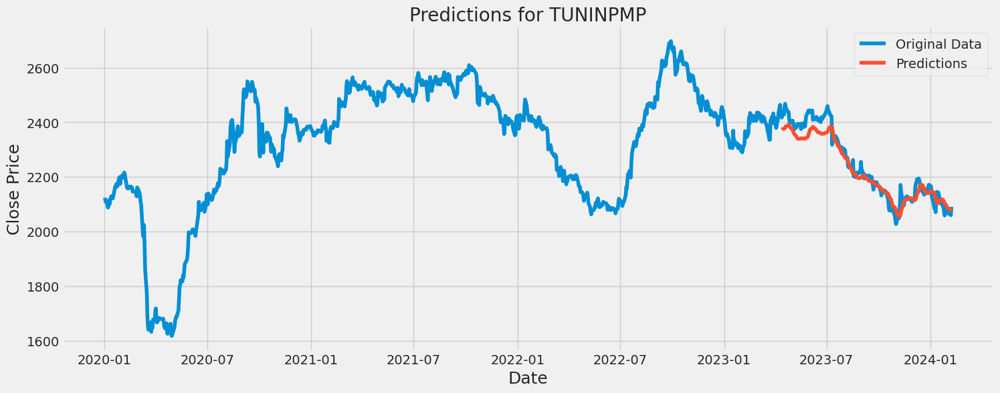

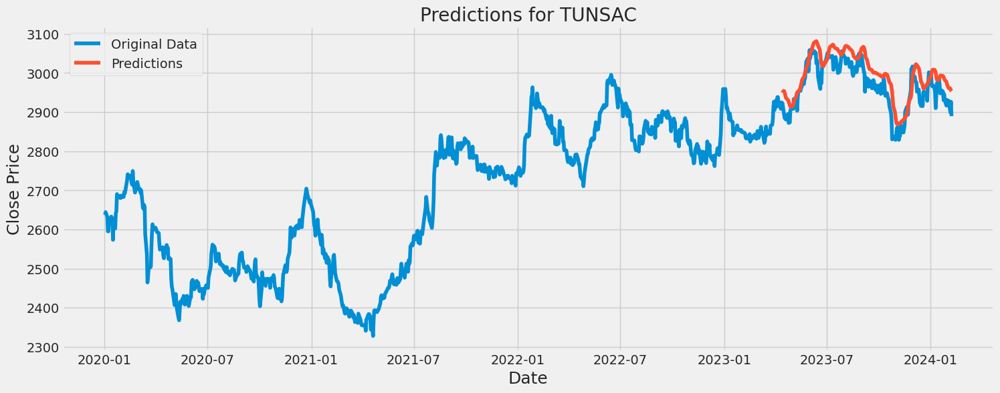

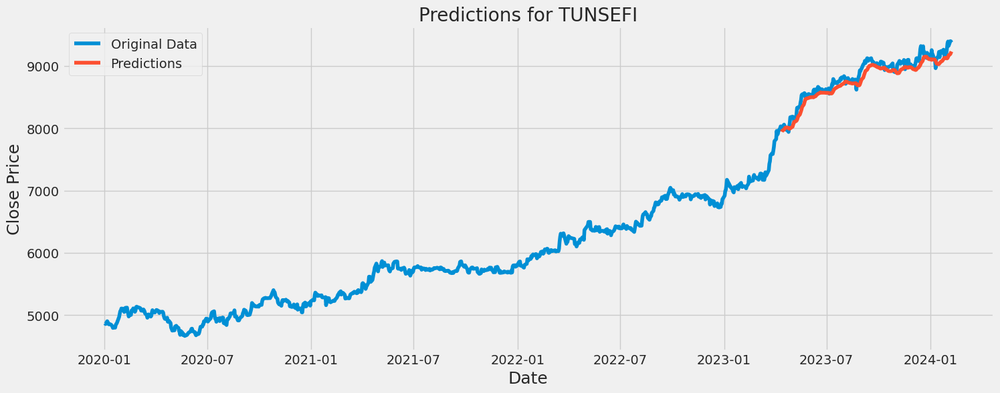

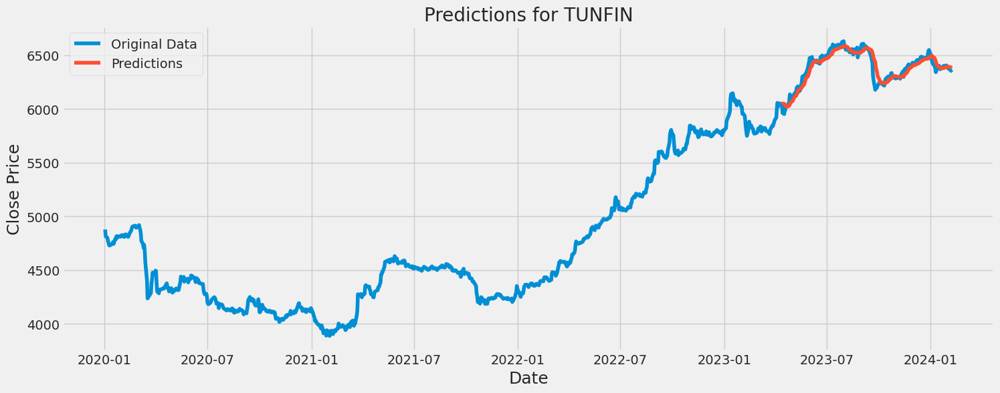

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

# Assuming 'Ind_Name' column is present in the dataset
unique_indexes = data_copy['Ind_Name'].unique()

# Create an empty dictionary to store models and predictions for each index
models = {}
predictions = {}

# Loop through each unique index
for index_name in unique_indexes:
    # Filter the data for the current index
    index_data = data_copy[data_copy['Ind_Name'] == index_name]

    # Filter only the 'Close' column
    data = index_data.filter(['Close'])

    # Convert the dataframe to a numpy array
    dataset = data.values

    # Scale the data
    scaler = MinMaxScaler(feature_range=(0,1))
    scaled_data = scaler.fit_transform(dataset)

    # Split the data into training and testing sets
    training_data_len = int(np.ceil(len(dataset) * 0.80))
    train_data = scaled_data[0:training_data_len, :]

    # Create the training data set
    x_train_ind, y_train_ind = [], []
    for i in range(60, len(train_data)):
        x_train_ind.append(train_data[i-60:i, 0])
        y_train_ind.append(train_data[i, 0])

    x_train_ind, y_train_ind = np.array(x_train_ind), np.array(y_train_ind)

    # Reshape the data
    x_train_ind = np.reshape(x_train_ind, (x_train_ind.shape[0], x_train_ind.shape[1], 1))

    # Build the LSTM model
    model = Sequential()
    model.add(LSTM(128, return_sequences=True, input_shape=(x_train_ind.shape[1], 1)))
    model.add(LSTM(64, return_sequences=False))
    model.add(Dense(25))
    model.add(Dense(1))

    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Train the model
    model.fit(x_train_ind, y_train_ind, batch_size=1, epochs=1)

    # Save the model
    models[index_name] = model

    # Create the testing data set
    test_data = scaled_data[training_data_len - 60: , :]

    # Create the data sets x_test and y_test
    x_test_ind = []
    y_test_ind = dataset[training_data_len:, :]
    for i in range(60, len(test_data)):
        x_test_ind.append(test_data[i-60:i, 0])

    # Convert the data to a numpy array
    x_test_ind = np.array(x_test_ind)

    # Reshape the data
    x_test_ind = np.reshape(x_test_ind, (x_test_ind.shape[0], x_test_ind.shape[1], 1))

    # Get the models predicted price values
    prediction = model.predict(x_test_ind)
    prediction = scaler.inverse_transform(prediction)

    # Store the predictions
    predictions[index_name] = prediction

# Plot the predictions for each index
for index_name, prediction in predictions.items():
    # Get the original data for the current index name
    index_data = data_copy[data_copy['Ind_Name'] == index_name]

    # Plot the original data and the predictions
    plt.figure(figsize=(16,6))
    plt.title(f'Predictions for {index_name}')
    plt.xlabel('Date', fontsize=18)
    plt.ylabel('Close Price', fontsize=18)
    plt.plot(index_data['Date'], index_data['Close'], label='Original Data')
    plt.plot(index_data['Date'].iloc[-len(prediction):], prediction, label='Predictions')
    plt.legend()
    plt.show()


In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score, mean_squared_error
import math

# Assuming 'Ind_Name' column is present in the dataset
unique_indexes = data_copy['Ind_Name'].unique()

# Create lists to store evaluation metrics for each index
r2_scores = []
mses = []
rmse_scores = []

# Loop through each unique index
for index_name in unique_indexes:
    # Retrieve the model and predictions for the current index
    model = models[index_name]
    prediction = predictions[index_name]

    # Get the original data for the current index name
    index_data = data_copy[data_copy['Ind_Name'] == index_name]
    y_test_ind = index_data['Close'].iloc[-len(prediction):].values

    # Calculate R^2 score
    r2 = r2_score(y_test_ind, prediction)
    r2_scores.append(r2)

    # Calculate MSE
    mse = mean_squared_error(y_test_ind, prediction)
    mses.append(mse)

    # Calculate RMSE
    rmse = math.sqrt(mse)
    rmse_scores.append(rmse)

    print(f"Index: {index_name}")
    print("R^2 Score:", r2)
    print("Mean Squared Error:", mse)
    print("Root Mean Squared Error:", rmse)
    print()

# Calculate average metrics
avg_r2 = np.mean(r2_scores)
avg_mse = np.mean(mses)
avg_rmse = np.mean(rmse_scores)

print("Average R^2 Score:", avg_r2)
print("Average Mean Squared Error:", avg_mse)
print("Average Root Mean Squared Error:", avg_rmse)


Index: TUNALIM
R^2 Score: 0.9172617056619277
Mean Squared Error: 27102.18605157346
Root Mean Squared Error: 164.62741585645284

Index: TUNASS
R^2 Score: 0.6417537391480173
Mean Squared Error: 35110.482830388864
Root Mean Squared Error: 187.37791446803132

Index: TUNBANK
R^2 Score: 0.8273693340411276
Mean Squared Error: 3636.6481130568095
Root Mean Squared Error: 60.30462762555465

Index: TUNBASE
R^2 Score: 0.9129966480708088
Mean Squared Error: 6746.068361127293
Root Mean Squared Error: 82.13445294836566

Index: TUNBATIM
R^2 Score: 0.909888693480023
Mean Squared Error: 161.36688148371624
Root Mean Squared Error: 12.703026469456649

Index: TUNCONS
R^2 Score: 0.9415551431735231
Mean Squared Error: 10357.943380212131
Root Mean Squared Error: 101.77398184316132

Index: TUNINDEX
R^2 Score: 0.8879181873225033
Mean Squared Error: 6183.996972382477
Root Mean Squared Error: 78.63839375510207

Index: TUNDIS
R^2 Score: 0.7385134863257714
Mean Squared Error: 2233.965329255909
Root Mean Squared Err

## XGBOOST

Here I split stock data frame into three subsets: training ( 70%
 ), validation ( 15%
 ) and test ( 15%
 ) sets. I calculated split indices and create three separate frames (train_df, valid_df, test_df). All three frames have been ploted in the chart below.

In [ ]:
import plotly.graph_objects as go

test_size  = 0.15
valid_size = 0.15

test_split_idx  = int(data_copy.shape[0] * (1-test_size))
valid_split_idx = int(data_copy.shape[0] * (1-(valid_size+test_size)))

train_df  = data_copy.loc[:valid_split_idx].copy()
valid_df  = data_copy.loc[valid_split_idx+1:test_split_idx].copy()
test_df   = data_copy.loc[test_split_idx+1:].copy()

fig = go.Figure()
fig.add_trace(go.Scatter(x=train_df.Date, y=train_df.Close, name='Training'))
fig.add_trace(go.Scatter(x=valid_df.Date, y=valid_df.Close, name='Validation'))
fig.add_trace(go.Scatter(x=test_df.Date,  y=test_df.Close,  name='Test'))
fig.show()

In [ ]:
drop_cols = ['Date',  'Open', 'Low', 'High', 'Ind_Name']

train_df = train_df.drop(columns=drop_cols)
valid_df = valid_df.drop(columns=drop_cols)
test_df = test_df.drop(columns=drop_cols)

In [ ]:
y_train = train_df['Close'].copy()
X_train = train_df.drop(columns=['Close'])

y_valid = valid_df['Close'].copy()
X_valid = valid_df.drop(columns=['Close'])

y_test = test_df['Close'].copy()
X_test = test_df.drop(columns=['Close'])

X_train.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9400 entries, 0 to 9399
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   std_close           9400 non-null   float64
 1   ROI                 9400 non-null   float64
 2   7_Days_Average_ROI  9400 non-null   float64
 3   ROI_Monthly_Avg     9400 non-null   float64
 4   Kurtosis            9400 non-null   float64
 5   Skewness            9400 non-null   float64
 6   yearly_std          9400 non-null   float64
dtypes: float64(7)
memory usage: 514.2 KB


In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV
import xgboost as xgb
import matplotlib.pyplot as plt
from xgboost import plot_importance, plot_tree
import time



parameters = {
    'n_estimators': [100, 200, 300, 400],
    'learning_rate': [0.001, 0.005, 0.01, 0.05],
    'max_depth': [8, 10, 12, 15],
    'gamma': [0.001, 0.005, 0.01, 0.02],
    'random_state': [42]
}

eval_set = [(X_train, y_train), (X_valid, y_valid)]
model = xgb.XGBRegressor(eval_set=eval_set, objective='reg:squarederror', verbose=False)
clf = GridSearchCV(model, parameters)

clf.fit(X_train, y_train)

print(f'Best params: {clf.best_params_}')
print(f'Best validation score = {clf.best_score_}')




KeyboardInterrupt: 

In [ ]:
%%time

model = xgb.XGBRegressor(**clf.best_params_, objective='reg:squarederror')
model.fit(X_train, y_train, eval_set=eval_set, verbose=False)

In [ ]:
y_pred = model.predict(X_test)
print(f'y_true = {np.array(y_test)[:5]}')
print(f'y_pred = {y_pred[:5]}')

In [ ]:
from sklearn.metrics import mean_squared_error
print(f'mean_squared_error = {mean_squared_error(y_test, y_pred)}')

In [ ]:
from plotly.subplots import make_subplots

predicted_prices = data_copy.loc[test_split_idx+1:].copy()
predicted_prices['Close'] = y_pred

fig = make_subplots(rows=2, cols=1)
fig.add_trace(go.Scatter(x=data_copy.Date, y=data_copy.Close,
                         name='Truth',
                         marker_color='LightSkyBlue'), row=1, col=1)

fig.add_trace(go.Scatter(x=predicted_prices.Date,
                         y=predicted_prices.Close,
                         name='Prediction',
                         marker_color='MediumPurple'), row=1, col=1)

fig.add_trace(go.Scatter(x=predicted_prices.Date,
                         y=y_test,
                         name='Truth',
                         marker_color='LightSkyBlue',
                         showlegend=False), row=2, col=1)

fig.add_trace(go.Scatter(x=predicted_prices.Date,
                         y=y_pred,
                         name='Prediction',
                         marker_color='MediumPurple',
                         showlegend=False), row=2, col=1)

fig.show()

## Multilinear Regression

In [ ]:
print(data_copy.columns)


Index(['Date', 'High', 'Close', 'Low', 'Open', 'Ind_Name', 'std_close', 'ROI',
       '7_Days_Average_ROI', 'ROI_Monthly_Avg', 'Kurtosis', 'Skewness',
       'yearly_std'],
      dtype='object')


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Define features and target variable
features = ['High', 'Low', 'Open', 'Ind_Name', 'std_close', 'ROI',
       '7_Days_Average_ROI', 'ROI_Monthly_Avg', 'Kurtosis', 'Skewness',
       'yearly_std']
target = 'Close'  # Target variable

# Assuming df is your DataFrame containing all data
X = data_copy[features]
y = data_copy[target]

# Handling potential non-numeric data and missing values:
X = pd.get_dummies(X, drop_first=True)  # Convert categorical variable into dummy/indicator variables
X.fillna(X.mean(), inplace=True)  # Impute missing values with mean

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scaling features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize and train the Random Forest Regressor Model
model3 = RandomForestRegressor(n_estimators=100, random_state=42)
model3.fit(X_train_scaled, y_train)

# Make predictions using the testing set
y_pred = model3.predict(X_test_scaled)

# Evaluate the model
from sklearn.metrics import mean_squared_error, r2_score
mse = mean_squared_error(y_test, y_pred)
rmse = mse**0.5
r2 = r2_score(y_test, y_pred)

# Print the shape of the training and testing sets
print("Training set shape:", X_train_scaled.shape, y_train.shape)
print("Testing set shape:", X_test_scaled.shape, y_test.shape)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)
print("R^2 Score:", r2)


Training set shape: (10742, 22) (10742,)
Testing set shape: (2686, 22) (2686,)
Mean Squared Error: 315.22442883444495
Root Mean Squared Error: 17.75456078968007
R^2 Score: 0.9999711182890362


In [ ]:
mape = mean_absolute_percentage_error(y_test, y_pred)
print("Mean Absolute Percentage Error:", mape)

Mean Absolute Percentage Error: 0.2071690431065671


In [ ]:
import plotly.graph_objs as go
import plotly.offline as py

# Create a scatter plot
trace = go.Scatter(
    x=y_test,
    y=y_pred,
    mode='markers',
    marker=dict(
        color='blue',
        opacity=0.5
    ),
    name='Actual vs Predicted'
)

# Create a diagonal line for perfect predictions
diagonal_line = go.Scatter(
    x=[y_test.min(), y_test.max()],
    y=[y_test.min(), y_test.max()],
    mode='lines',
    line=dict(color='black', dash='dash'),
    name='Perfect Prediction'
)

# Define layout
layout = go.Layout(
    title='Actual vs Predicted Values',
    xaxis=dict(title='Actual'),
    yaxis=dict(title='Predicted')
)

# Create figure
fig = go.Figure(data=[trace, diagonal_line], layout=layout)

# Show the plot
py.iplot(fig)


In [ ]:
import plotly.graph_objs as go
import plotly.offline as py

# Create a trace for actual Adjusted Close
trace_actual = go.Scatter(
    x=data_copy.index,  # Assuming df has a DateTimeIndex
    y=y_test,
    mode='lines',
    name='Actual Close',
    line=dict(color='blue')
)

# Create a trace for predicted Adjusted Close
trace_predicted = go.Scatter(
    x=data_copy.index,  # Assuming df has a DateTimeIndex
    y=y_pred,
    mode='lines',
    name='Predicted  Close',
    line=dict(color='red')
)

# Layout
layout = go.Layout(
    title='Actual vs Predicted Close',
    xaxis=dict(title='Date'),
    yaxis=dict(title='Close')
)

# Create the figure
fig = go.Figure(data=[trace_actual, trace_predicted], layout=layout)

# Show the plot
py.iplot(fig)


In [ ]:
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score

# Convert predicted values to binary (0 or 1) for classification
y_pred_binary = (y_pred > 0.5).astype(int)  # Assuming threshold of 0.5 for binary classification

# Convert actual values to binary (0 or 1) for classification
y_test_binary = (y_test > 0.5).astype(int)

# Calculate precision, recall, accuracy, and F1 score
precision = precision_score(y_test_binary, y_pred_binary)
recall = recall_score(y_test_binary, y_pred_binary)
accuracy = accuracy_score(y_test_binary, y_pred_binary)
f1 = f1_score(y_test_binary, y_pred_binary)

print("Precision:", precision)
print("Recall:", recall)
print("Accuracy:", accuracy)
print("F1 Score:", f1)


Precision: 1.0
Recall: 1.0
Accuracy: 1.0
F1 Score: 1.0


In [ ]:
from sklearn.model_selection import cross_val_score

# Example using 10-fold cross-validation
scores = cross_val_score(model3, X_train, y_train, cv=10)
print("Cross-validation scores:", scores)
print("Mean score:", scores.mean())

Cross-validation scores: [0.99995956 0.99997402 0.99997461 0.99996804 0.99997019 0.99996168
 0.99997291 0.99995541 0.99996509 0.9999693 ]
Mean score: 0.9999670798113038


## Markowitz